## **1. Dataset Overview**
#####ID: Customer's unique identifier
#####Year_Birth: Customer's birth year
#####Education: Customer's education level
#####Marital_Status: Customer's marital status
#####Income: Customer's yearly household income
#####Kidhome: Number of children in customer's household
#####Teenhome: Number of teenagers in customer's household
#####Dt_Customer: Date of customer's enrollment with the company
#####Recency: Number of days since customer's last purchase
#####Complain: 1 if the customer complained in the last 2 years, 0 otherwise
#####MntWines: Amount spent on wine in last 2 years
#####MntFruits: Amount spent on fruits in last 2 years
#####MntMeatProducts: Amount spent on meat in last 2 years
#####MntFishProducts: Amount spent on fish in last 2 years
#####MntSweetProducts: Amount spent on sweets in last 2 years
#####MntGoldProds: Amount spent on gold in last 2 years
#####NumDealsPurchases: Number of purchases made with a discount
#####AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
#####AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
#####AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
#####AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
#####AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
#####Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
#####NumWebPurchases: Number of purchases made through the company’s website
#####NumCatalogPurchases: Number of purchases made using a catalogue
#####NumStorePurchases: Number of purchases made directly in stores
#####NumWebVisitsMonth: Number of visits to company’s website in the last month

## **2. Project Goal**

## **3. Exploratoy Data Analysis & Data Preprocessing**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats

In [3]:
path='/content/drive/MyDrive/Dataset/marketing_campaign (1).csv'
df=pd.read_csv(path, sep="\t")

In [4]:
pd.set_option('display.max_columns',30)

In [5]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [6]:
df.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0
2239,9405,1954,PhD,Married,52869.0,1,1,15-10-2012,40,84,3,61,2,1,21,3,3,1,4,7,0,0,0,0,0,0,3,11,1


In [7]:
df = df.drop(['Z_CostContact', 'Z_Revenue'], axis=1)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [9]:
df.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
dtype: int64

In [10]:
df.isna().mean()

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 0.010714
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Response               0.000000
dtype: float64

In [11]:
df=df.dropna(subset=['Income'])

- 'Income' column has 24 missing values out of a total of 2240 rows (approximately 1.07%). I dropped missing values due to the fact that this is a very small proportion indicating that the impact on dataset's integrity and representativeness will be minimal.

In [12]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,5588.353339,1968.820397,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253,2.323556,4.085289,2.671029,5.800993,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,0.150271
std,3249.376275,11.985554,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414,1.923716,2.740951,2.926734,3.250785,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.357417
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2814.750000,1959.000000,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [13]:
num_cols = df.dtypes[df.dtypes !='object'].index.to_list()
if 'ID' in num_cols:
  num_cols.remove('ID')

In [14]:
num_cols

['Year_Birth',
 'Income',
 'Kidhome',
 'Teenhome',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Response']

In [15]:
corr = df[num_cols].corr()
corr

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
Year_Birth,1.000000,-0.161791,0.233615,-0.350791,-0.016295,-0.159451,-0.017747,-0.033697,-0.040425,-0.020204,-0.064208,-0.058668,-0.153051,-0.121764,-0.127891,0.123904,0.061784,-0.066109,0.010575,-0.009611,-0.006717,-0.030407,0.023692
Income,-0.161791,1.000000,-0.428669,0.019133,-0.003970,0.578650,0.430842,0.584633,0.438871,0.440744,0.325916,-0.083101,0.387878,0.589162,0.529362,-0.553088,-0.016174,0.184400,0.335943,0.276820,0.087545,-0.027225,0.133047
Kidhome,0.233615,-0.428669,1.000000,-0.039869,0.011492,-0.497336,-0.373396,-0.439261,-0.388884,-0.378026,-0.355029,0.216913,-0.371977,-0.504501,-0.501349,0.447477,0.016066,-0.162026,-0.205305,-0.174163,-0.081868,0.040978,-0.077909
Teenhome,-0.350791,0.019133,-0.039869,1.000000,0.013838,0.003747,-0.176558,-0.261122,-0.205242,-0.163056,-0.019887,0.386246,0.162077,-0.112692,0.049737,0.131240,-0.042522,0.038376,-0.190791,-0.144855,-0.015521,0.003307,-0.153901
Recency,-0.016295,-0.003970,0.011492,0.013838,1.000000,0.015721,-0.005844,0.022518,0.000551,0.025110,0.017663,0.002115,-0.005641,0.024081,-0.000434,-0.018564,-0.032257,0.017566,-0.000482,-0.021061,-0.001400,0.013637,-0.199766
MntWines,-0.159451,0.578650,-0.497336,0.003747,0.015721,1.000000,0.387024,0.568860,0.397721,0.390326,0.392731,0.008886,0.553786,0.634753,0.640012,-0.321978,0.061463,0.373143,0.473550,0.351417,0.206185,-0.039470,0.246299
MntFruits,-0.017747,0.430842,-0.373396,-0.176558,-0.005844,0.387024,1.000000,0.547822,0.593431,0.571606,0.396487,-0.134512,0.302039,0.486263,0.458491,-0.418729,0.014424,0.006396,0.212871,0.191816,-0.009980,-0.005324,0.122443
MntMeatProducts,-0.033697,0.584633,-0.439261,-0.261122,0.022518,0.568860,0.547822,1.000000,0.573574,0.535136,0.359446,-0.121308,0.307090,0.734127,0.486006,-0.539484,0.018438,0.091618,0.376867,0.313076,0.043521,-0.023782,0.237746
MntFishProducts,-0.040425,0.438871,-0.388884,-0.205242,0.000551,0.397721,0.593431,0.573574,1.000000,0.583867,0.427142,-0.143241,0.299688,0.532757,0.457745,-0.446423,-0.000219,0.016105,0.196277,0.261608,0.002345,-0.021220,0.108145
MntSweetProducts,-0.020204,0.440744,-0.378026,-0.163056,0.025110,0.390326,0.571606,0.535136,0.583867,1.000000,0.357450,-0.121432,0.333937,0.495136,0.455225,-0.422371,0.001780,0.029313,0.259230,0.245102,0.010188,-0.022641,0.116170


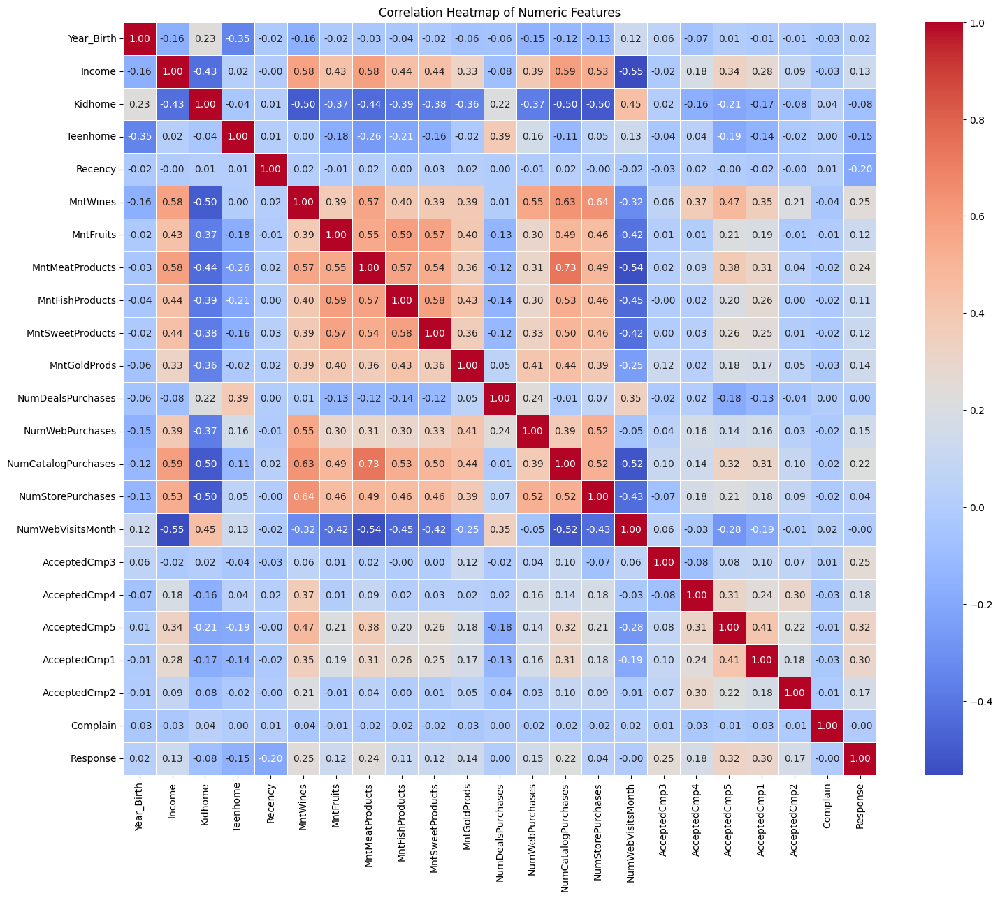

In [16]:
plt.figure(figsize=(18,14))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()


 **Strong correlations between variables**
- **MntMeatProducts & NumCatalogPurchases** : 0.72
  
  : There is a strong positive relationship between the amount spent on meat products and the number of purchases through catalogs. It indicates that customers spent more money on meat products are likely to purchase more products through catalogs. This finding could suggest that catalog marketing could be effective for increasing meat products pruchases and people purchasing meat products tend to prefer catalog channel for their shopping.
- **MntWines & NumCatalogPurchases** : 0.64
  
  : There is a strong positive relationship between the amount spent on wines and the number catalog purchases. It indicates that customers spent more money on wines are likely to purchase more products through catalogs. This finding could sugget that catalog marketing could be effective for increasing wine pruchases and people purchasing wines tend to prefer catalog channel for their shopping.
- **MntWines & NumStorePurchases** : 0.64

  : There is a strong positive relationship between the amount spent on wines and the number store purchases. It indicates that customers spent more money on wines are likely to purchase more products throung stores. This finding implies that in-store marketing could be effective for increasing wine pruchases and people purchasing wines tend to prefer buying products at stores.

- **MntFruits & MntFishProducts** : 0.59

  :There is a moderate positive relationship between the amount spent on fruits and fish products. It indicates that customers spent more money on fruits are likely to purchase more fish products.

- **Income & NumCatalogPurchases** : 0.59

  : There is a moderate positive relationship between income and the number catalog purchases. It indicates that higher-income customers tend to purchase more products throung catalogs. This also implies that catalog marketing could be effective for tageting higher-incomes customers.

- **Income & MntWines** : 0.58

  : There is a moderate positive relationship between income and the amount spent on wines. It indicates that higher-income customers tend to purchase more wines.

- **Income & MntMeatProducts** : 0.58

  : There is a moderate positive relationship between income and the amount spent on meat products. It indicates that higher-income customers are likely to purchase more meat products.

- **MntFishProducts & MntSweetProducts** : 0.58

  : There is a moderate positive relationship between the amount spent on fish products and the amount spent on sweet products. It indicates that customers spent more on fish products are likely to purchase more sweet products.

- **MntFruits & MntSweetProducts** : 0.57

  : There is a moderate positive relationship between the amount spent on fruits and the amount spent on sweet products. It indicates that customers spent more on fruits are likely to purchase more sweet products.

- **MntMeatProducts & MntFishProducts** : 0.57

  : There is a moderate positive relationship between the amount spent on meat products and the amount spent on fish products. It indicates that customers spent more on meat products are likely to purchase more fish products.

- **MntWines & MntMeatProducts** : 0.56

  : There is a moderate positive relationship between the amount spent on wines and the amount spent on meat products. It indicates that customers spent more on wines are likely to purchase more meat products.

- **MntFruits & MntMeatProducts** : 0.54

  : There is a moderate positive relationship between the amount spent on fruits and the amount spent on meat products. It indicates that customers spent more on fruits are likely to purchase more meat products.

- **MntWines & NumWebPurchases** : 0.54

  : There is a moderate positive relationship between the amount spent on wines and the number of web purchases. It indicates that customers spent more on wines tend to purchase more products through online shopping.

- **Income & NumWebVisitsMonth** : -0.55

  : There is a moderate negative relationship between income and the number of web visits per month. It indicates that higer-income customers tend to visit website less frequently.

- **MntMeatProducts & NumWebPurchases** : -0.54

  : There is a moderate negative relationship between the amount spent on meat products and the number of web purchases. It indicates that customers spent more on meat products are less likely to prefer onling shopping.

- **MntFishProducts & NumCatalogPurchases** : 0.53

  : There is a moderate positive relationship between the amount spent on fish products and the number of catalog purchases. It indicates that customers spent more on fish products are likely to purchase products through catalogs.

- **NumCatalogPurchases & NumWebVisitsMonth** : -0.52

  : There is a moderate negative relationship between the number of catalog purchases and the number of web visits per month. It indicates that customers who purchase more products through catalogs are less likely to visit website.

- **MntMeatProducts & MntSweetProducts** : 0.52

  : There is a moderate positive relationship between the amount spent on meat products and the amount spent on sweet products. It indicates that customers who purchase more meat prodcuts are more likely to purchase sweet products.

- **NumCatalogPurchases & NumStorePurchases** : 0.52

   : There is a moderate positive relationship between the number of catalog pruchases and the number of store purchases. It indicates that customers who purchase more prodcuts through catalogs are more likely to prefer store purchases.

- **NumWebPurchases & NumStorePurchases** : 0.50
  
  : There is a moderate positive relationship between the number of web pruchases and the number of store purchases. It indicates that customers who purchase more prodcuts online are more likely to prefer store purchases.

- **Kidhome & MntWines** : -0.50
  
  : There is a moderate negative relationship between the number of kids in the household and the amount spent on wines. It indicates that customers who have kids are less likely to purchase wines.

- **Kidhome & NumCatalogPurchases** : -0.50

  : There is a moderate negative relationship between the number of kids in the household and the number of catalog purchases. It indicates that customers who have kids are less likely to purchase products through catalogs.

- **Kidhome & NumStorePurchases** : -0.50

  : There is a moderate negative relationship between the number of kids in the household and the number of store purchases. It indicates that customers who have kids are less likely to purchase products offline.

<ipython-input-17-e20839edfd1b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['ID'].value_counts().index[:num_ids_to_display],


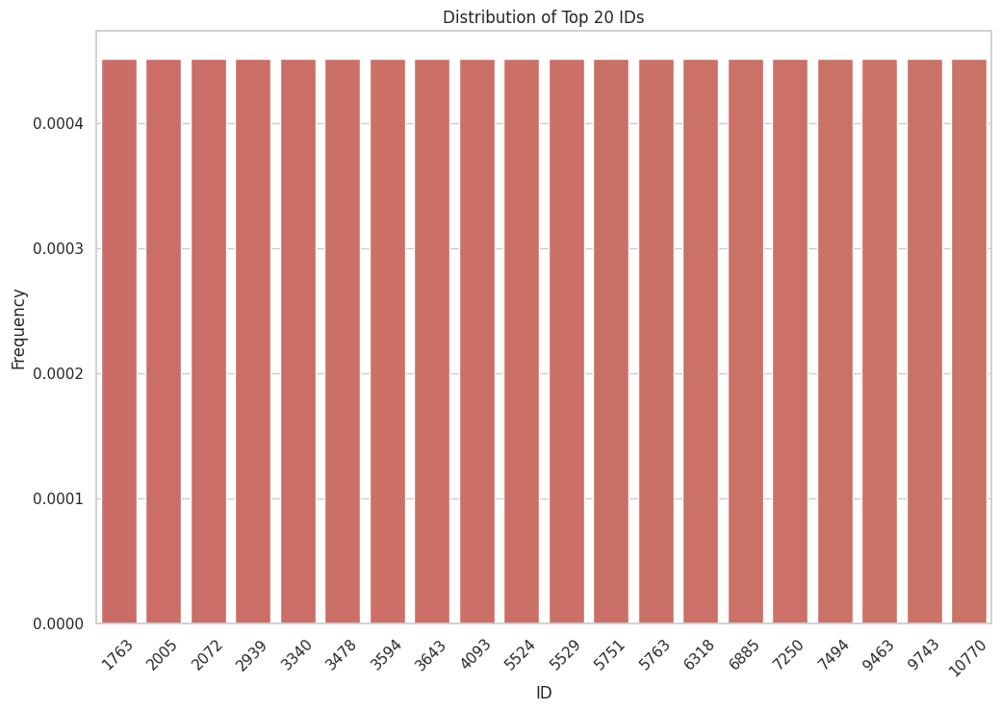

In [17]:
cm=sns.color_palette('hls', len(df['ID'].unique()))
sns.set_theme(style='whitegrid')
num_ids_to_display = 20
total_ids = df['ID'].value_counts().sum()
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=df['ID'].value_counts().index[:num_ids_to_display],
                 y=df['ID'].value_counts()[:num_ids_to_display] / total_ids,
                 palette=cm[:num_ids_to_display])
ax.set(xlabel='ID', ylabel='Frequency', title='Distribution of Top 20 IDs')
plt.xticks(rotation=45)
plt.show()

In [18]:
df['ID'].nunique()

2216

In [19]:
len(df['ID'].unique())

2216

<ipython-input-20-8b319429b5e7>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['Year_Birth'].value_counts().index,


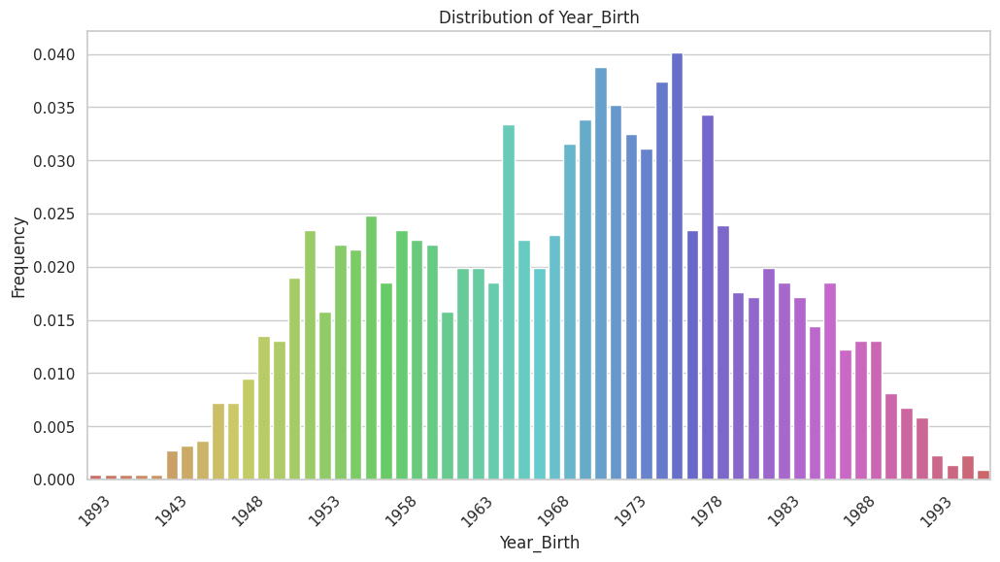

In [20]:
cm = sns.color_palette('hls', len(df['Year_Birth'].unique()))

sns.set_theme(style='whitegrid')

total_birth = df['Year_Birth'].value_counts().sum()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=df['Year_Birth'].value_counts().index,
                 y=df['Year_Birth'].value_counts() / total_birth,
                 palette=cm)
ax.set(xlabel='Year_Birth', ylabel='Frequency', title='Distribution of Year_Birth')

plt.xticks(rotation=45)

every_nth = 5
for n, label in enumerate(ax.xaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)

plt.show()

<ipython-input-21-0912971e4cad>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Year_Birth'], palette='viridis')


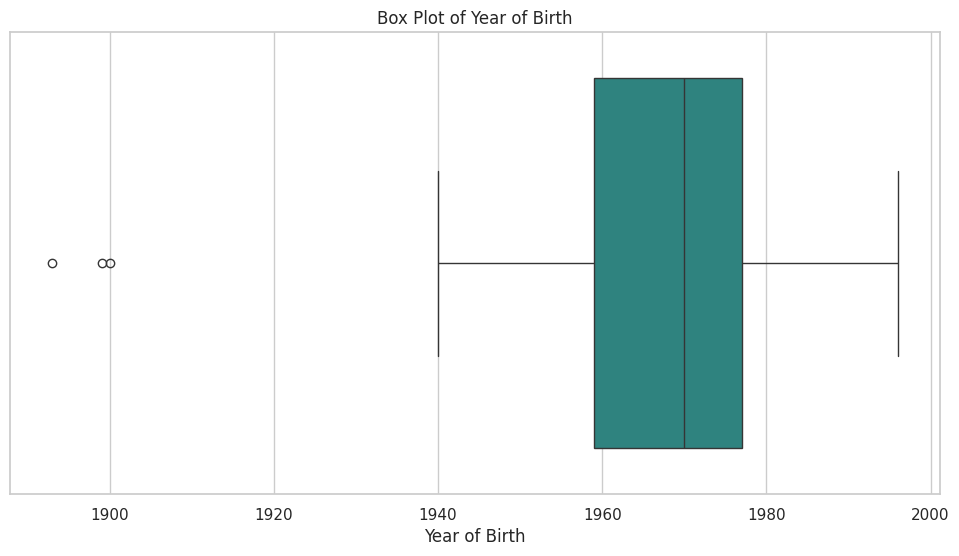

Q1 (25th percentile): 1959.0
Median (50th percentile): 1970.0
Q3 (75th percentile): 1977.0
IQR (Interquartile Range): 18.0
Lower Whisker: 1932.0
Upper Whisker: 2004.0


In [21]:
plt.figure(figsize=(12, 6))

sns.boxplot(x=df['Year_Birth'], palette='viridis')
plt.title('Box Plot of Year of Birth')
plt.xlabel('Year of Birth')

plt.show()

q1 = df['Year_Birth'].quantile(0.25)
median = df['Year_Birth'].quantile(0.50)
q3 = df['Year_Birth'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

Box Plot of 'Year_birth' variable.

- Q1 is 1959 meaning that 25% of customers were born before this year.
- Median is 1970 indicating that the half of the customers were born before 1970 and the rest of the customers were born after this year.
- Q3 is 1977 meaning that 75% of customers were born before 1977.
- Whiskers extend from 1932 to 2004 and any birth years outside this range can be considered outliers.


In [22]:
2024-df['Year_Birth']

0       67
1       70
2       59
3       40
4       43
        ..
2235    57
2236    78
2237    43
2238    68
2239    70
Name: Year_Birth, Length: 2216, dtype: int64

In [23]:
df['age']=2024-df['Year_Birth']

<ipython-input-24-fc8ebbde7ae4>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['age'].value_counts().index,


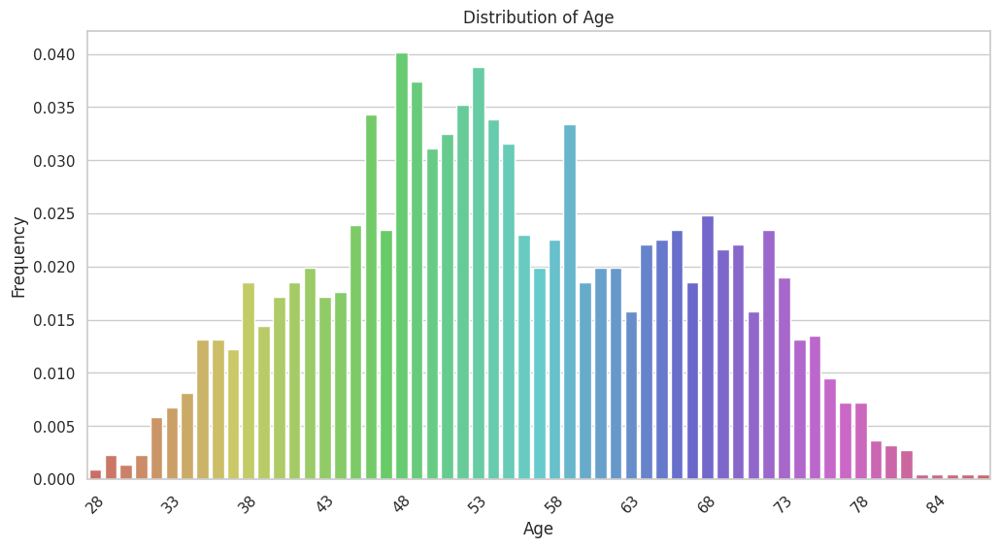

In [24]:
cm = sns.color_palette('hls', len(df['age'].unique()))

sns.set_theme(style='whitegrid')

total_birth = df['age'].value_counts().sum()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=df['age'].value_counts().index,
                 y=df['age'].value_counts() / total_birth,
                 palette=cm)
ax.set(xlabel='Age', ylabel='Frequency', title='Distribution of Age')

plt.xticks(rotation=45)

every_nth = 5
for n, label in enumerate(ax.xaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)

plt.show()

<ipython-input-25-d7777abf2c9d>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['age'], palette='viridis')


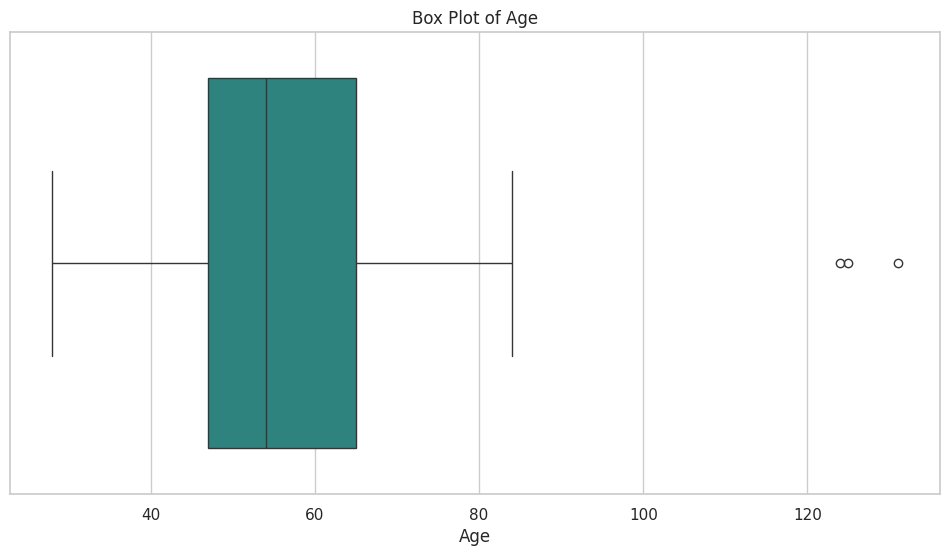

Q1 (25th percentile): 47.0
Median (50th percentile): 54.0
Q3 (75th percentile): 65.0
IQR (Interquartile Range): 18.0
Lower Whisker: 20.0
Upper Whisker: 92.0


In [25]:
plt.figure(figsize=(12, 6))

sns.boxplot(x=df['age'], palette='viridis')
plt.title('Box Plot of Age')
plt.xlabel('Age')

plt.show()

q1 = df['age'].quantile(0.25)
median = df['age'].quantile(0.50)
q3 = df['age'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

Box Plot of 'Age' variable.

- Q1 is 47 meaning that 25% of customers were 47 years old in 2024.
- Median is 54 indicating that the half of the customers became 54 years old in 2024 and the rest of the customers were more that 54 years old this year.
- Q3 is 65 meaning that 75% of customers became 65 years old in 2024.
- Whiskers extend from 20 to 92 and any ages outside this range can be considered outliers.


In [26]:
df = df.drop(columns=['Year_Birth'])

In [27]:
df['Marital_Status'].nunique()

8

In [28]:
df['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [29]:
df['Marital_Status'].value_counts()

Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [30]:
values_to_drop = ['Widow', 'Alone', 'Absurd', 'YOLO']

# Calculate the proportion of each category
original_proportions = df['Marital_Status'].value_counts(normalize=True)
dropped_proportions = df['Marital_Status'].isin(values_to_drop).mean()

print("Original Proportions:")
print(original_proportions)
print("\nProportion of Dropped Categories:")
print(dropped_proportions)

Original Proportions:
Marital_Status
Married     0.386733
Together    0.258574
Single      0.212545
Divorced    0.104693
Widow       0.034296
Alone       0.001354
Absurd      0.000903
YOLO        0.000903
Name: proportion, dtype: float64

Proportion of Dropped Categories:
0.037454873646209384


<ipython-input-31-3c073ebcb395>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
<ipython-input-31-3c073ebcb395>:7: UserWarning: The palette list has more values (59) than needed (8), which may not be intended.
  sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
<ipython-input-31-3c073ebcb395>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=dropped_counts.index, y=dropped_counts.values, ax=axes[1], palette=cm)
<ipython-input-31-3c073ebcb395>:13: UserWarning: The palette list has more values (59) than needed (4), which may not be intended.
  sns.barplot(x=dropped_counts.index,

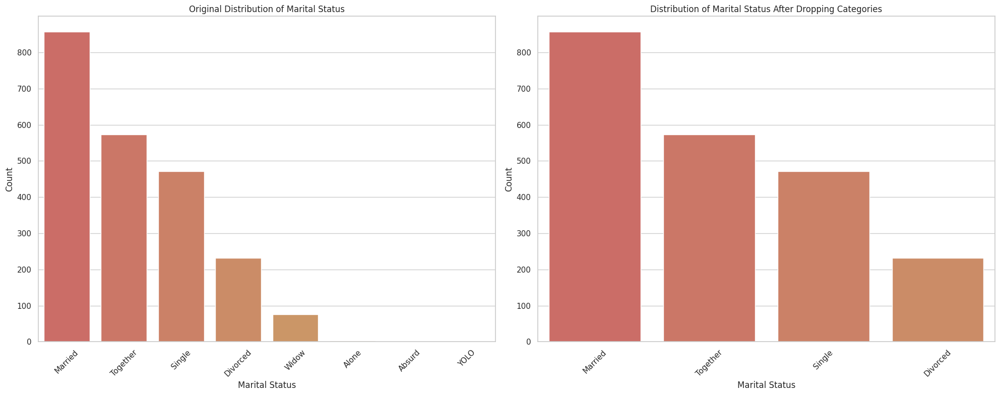

Original distribution of 'Marital_Status':
Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

Distribution of 'Marital_Status' after dropping categories:
Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Name: count, dtype: int64


In [31]:
original_counts = df['Marital_Status'].value_counts()
categories_to_drop = ['Absurd', 'Alone', 'YOLO', 'Widow']
df_dropped = df[~df['Marital_Status'].isin(categories_to_drop)]
dropped_counts = df_dropped['Marital_Status'].value_counts()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
# Original distribution
sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
axes[0].set_title('Original Distribution of Marital Status')
axes[0].set_xlabel('Marital Status')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)
# Distribution after dropping categories
sns.barplot(x=dropped_counts.index, y=dropped_counts.values, ax=axes[1], palette=cm)
axes[1].set_title('Distribution of Marital Status After Dropping Categories')
axes[1].set_xlabel('Marital Status')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()
print("Original distribution of 'Marital_Status':")
print(original_counts)
print("\nDistribution of 'Marital_Status' after dropping categories:")
print(dropped_counts)

**Justifiation for Dropping Categories of 'Marital_Status'** :
- The distribution of 'Martial_Status' after dropping categories has more balanced distribution for more robust analysis due to the fact that the categories 'Widow', 'Alone', 'Absurd', and 'YOLO' have significantly lower counts compared to other categories.


In [32]:
drop_categories = ['Widow','Alone','Absurd', 'YOLO']
df = df[~df['Marital_Status'].isin(drop_categories)]

In [33]:
print("Updated Distribution:\n", df['Marital_Status'].value_counts())

Updated Distribution:
 Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Name: count, dtype: int64


In [34]:
df['Education'].value_counts()

Education
Graduation    1079
PhD            454
Master         352
2n Cycle       195
Basic           53
Name: count, dtype: int64

<ipython-input-35-260f71cae35e>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Education'].value_counts().index, y=df['Education'].value_counts(), palette=cm)


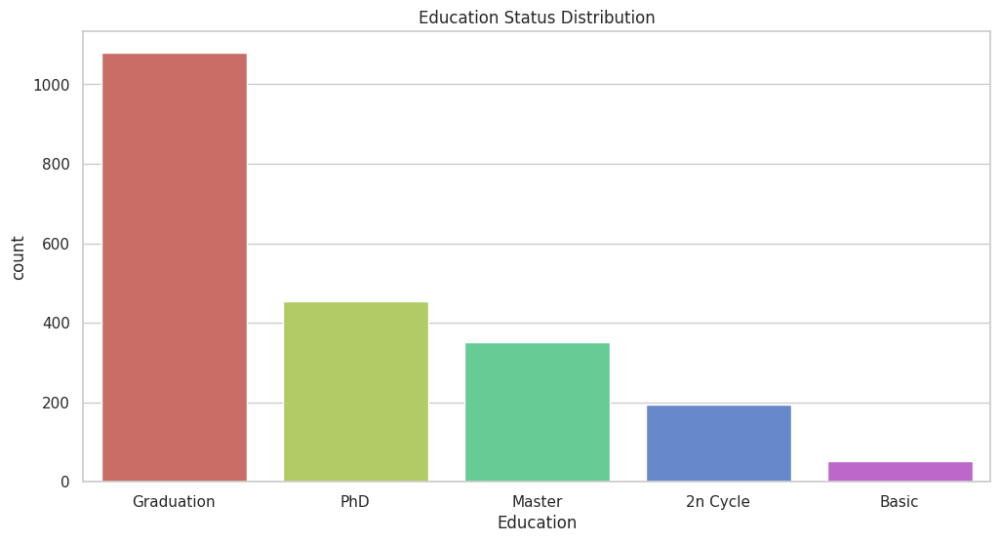

In [35]:
cm=sns.color_palette('hls', len(df['Education'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Education'].value_counts().index, y=df['Education'].value_counts(), palette=cm)
ax.set(xlabel='Education', ylabel='count', title='Education Status Distribution')
plt.show()

In [36]:
# Before transformation
print("Original Distribution:\n", df['Education'].value_counts())

# Apply the transformation
transformaton_categories = df['Education'].replace({'2n Cycle': 'Graduation', 'Basic': 'Graduation','PhD': 'Advanced degree', 'Master': 'Advanced degree'}).value_counts()

# After transformation
print("Transformed Distribution:\n", transformaton_categories)

Original Distribution:
 Education
Graduation    1079
PhD            454
Master         352
2n Cycle       195
Basic           53
Name: count, dtype: int64
Transformed Distribution:
 Education
Graduation         1327
Advanced degree     806
Name: count, dtype: int64


<ipython-input-37-af1a8caf7396>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
<ipython-input-37-af1a8caf7396>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=transformation_counts.index, y=transformation_counts.values, ax=axes[1], palette=cm)
<ipython-input-37-af1a8caf7396>:12: UserWarning: The palette list has more values (5) than needed (2), which may not be intended.
  sns.barplot(x=transformation_counts.index, y=transformation_counts.values, ax=axes[1], palette=cm)


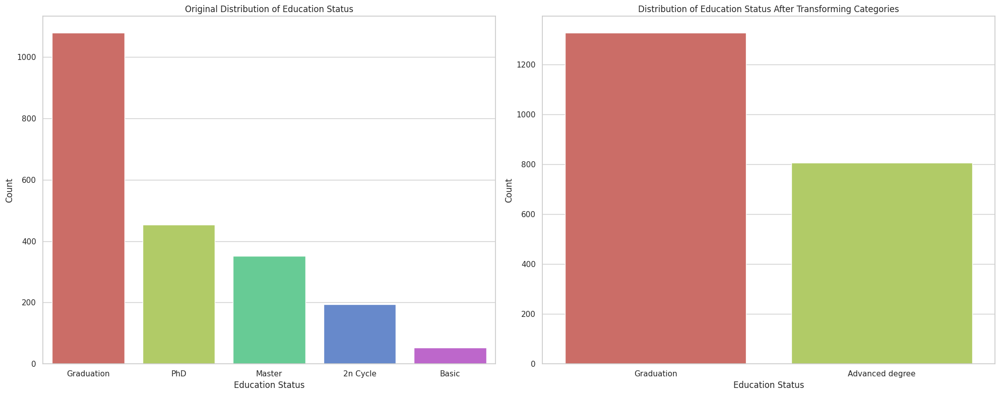

Original distribution of 'Education Status':
Education
Graduation    1079
PhD            454
Master         352
2n Cycle       195
Basic           53
Name: count, dtype: int64

Distribution of 'Education_Status' after transforming categories:
Education
Graduation         1327
Advanced degree     806
Name: count, dtype: int64


In [37]:
original_counts = df['Education'].value_counts()
transformaton_categories = df['Education'].replace({'2n Cycle': 'Graduation', 'Basic': 'Graduation','PhD': 'Advanced degree', 'Master': 'Advanced degree'})
transformation_counts = transformaton_categories.value_counts()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
# Original distribution
sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
axes[0].set_title('Original Distribution of Education Status')
axes[0].set_xlabel('Education Status')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=0)
# Distribution after transforming categories
sns.barplot(x=transformation_counts.index, y=transformation_counts.values, ax=axes[1], palette=cm)
axes[1].set_title('Distribution of Education Status After Transforming Categories')
axes[1].set_xlabel('Education Status')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.show()
print("Original distribution of 'Education Status':")
print(original_counts)
print("\nDistribution of 'Education_Status' after transforming categories:")
print(transformation_counts)

**Justifiation for Transforming Categories of 'Education_Status'**
- Reducing the number of categories to adjust the inital imbalance among categories for reducing the risk of overfitting for rare categories while enhancing model performance

In [38]:
df['Education']=df['Education'].replace({'2n Cycle': 'Graduation', 'Basic': 'Graduation','PhD': 'Advanced degree', 'Master': 'Advanced degree'})

In [39]:
df['Kidhome'].nunique()

3

In [40]:
df['Kidhome'].unique()

array([0, 1, 2])

In [41]:
df['Kidhome'].value_counts()

Kidhome
0    1221
1     866
2      46
Name: count, dtype: int64

<ipython-input-42-77fc1bf54dc9>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Kidhome'].value_counts().index, y=df['Kidhome'].value_counts(), palette=cm)


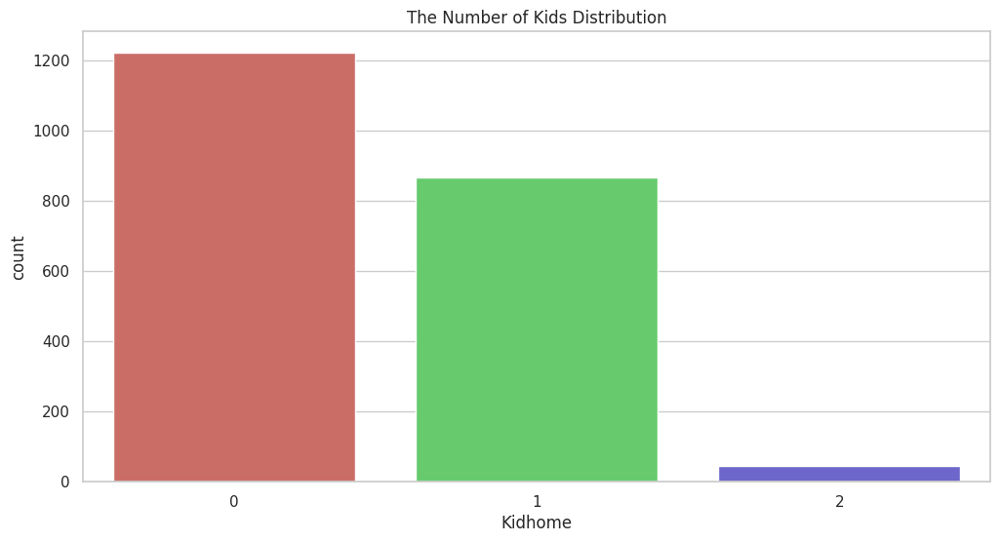

In [42]:
cm=sns.color_palette('hls', len(df['Kidhome'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Kidhome'].value_counts().index, y=df['Kidhome'].value_counts(), palette=cm)
ax.set(xlabel='Kidhome', ylabel='count', title='The Number of Kids Distribution')
plt.show()

<ipython-input-43-6dc9fd806546>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['Kidhome'], palette='viridis')


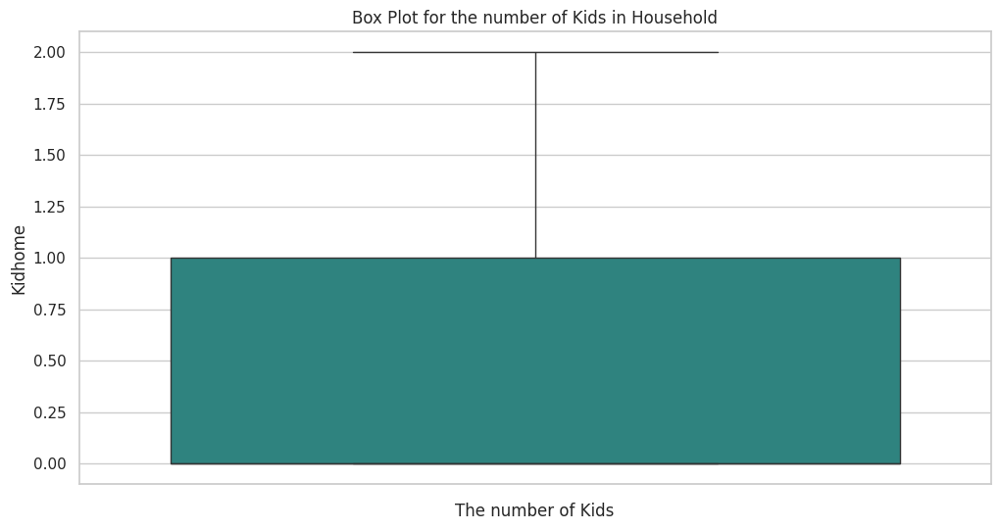

Q1 (25th percentile): 0.0
Median (50th percentile): 0.0
Q3 (75th percentile): 1.0
IQR (Interquartile Range): 1.0
Lower Whisker: -1.5
Upper Whisker: 2.5


In [43]:
plt.figure(figsize=(12, 6))

sns.boxplot(y=df['Kidhome'], palette='viridis')
plt.title('Box Plot for the number of Kids in Household')
plt.xlabel('The number of Kids')

plt.show()

q1 = df['Kidhome'].quantile(0.25)
median = df['Kidhome'].quantile(0.50)
q3 = df['Kidhome'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

In [44]:
df['Teenhome'].unique()

array([0, 1, 2])

In [45]:
df['Teenhome'].nunique()

3

In [46]:
df['Teenhome'].value_counts()

Teenhome
0    1116
1     967
2      50
Name: count, dtype: int64

<ipython-input-47-7a96f136b441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Teenhome'].value_counts().index, y=df['Teenhome'].value_counts(), palette=cm)


[Text(0.5, 0, 'Teenhome'),
 Text(0, 0.5, 'count'),
 Text(0.5, 1.0, 'The Number of Teenagers Distribution')]

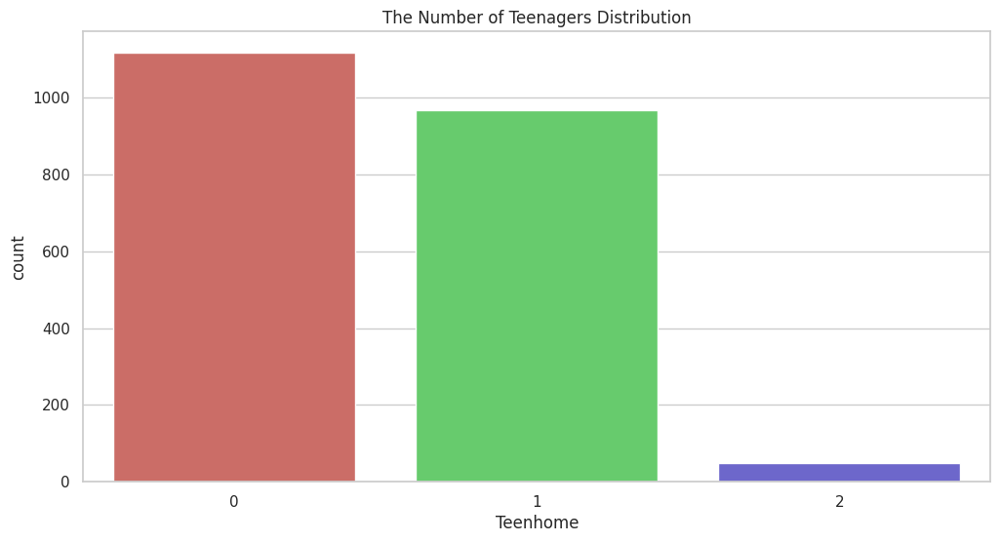

In [47]:
cm=sns.color_palette('hls', len(df['Teenhome'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Teenhome'].value_counts().index, y=df['Teenhome'].value_counts(), palette=cm)
ax.set(xlabel='Teenhome', ylabel='count', title='The Number of Teenagers Distribution')

<ipython-input-48-8205a5a4658b>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['Teenhome'], palette='viridis')


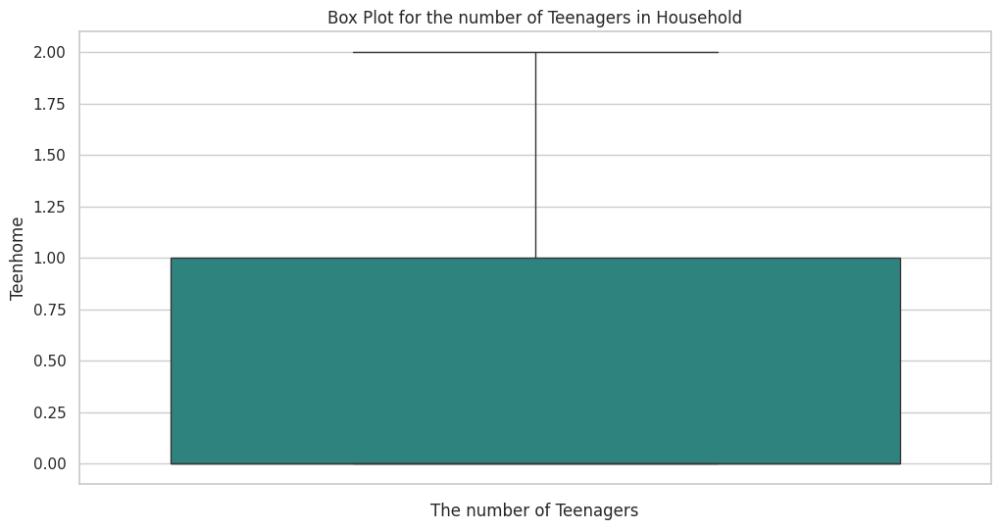

Q1 (25th percentile): 0.0
Median (50th percentile): 0.0
Q3 (75th percentile): 1.0
IQR (Interquartile Range): 1.0
Lower Whisker: -1.5
Upper Whisker: 2.5


In [48]:
plt.figure(figsize=(12, 6))

sns.boxplot(y=df['Teenhome'], palette='viridis')
plt.title('Box Plot for the number of Teenagers in Household')
plt.xlabel('The number of Teenagers')

plt.show()

q1 = df['Teenhome'].quantile(0.25)
median = df['Teenhome'].quantile(0.50)
q3 = df['Teenhome'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

In [49]:
# Create a new column 'Has_Kids_Teenagers' with values 'Yes' or 'No'
df['Has_Kids_Teenagers'] = df.apply(lambda row: 'Yes' if row['Kidhome'] > 0 or row['Teenhome'] > 0 else 'No', axis=1)
df.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,age,Has_Kids_Teenagers
0,5524,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,67,No
1,2174,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,70,Yes
2,4141,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,59,No
3,6182,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,40,Yes
4,5324,Advanced degree,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,43,Yes


In [50]:
df['Has_Kids_Teenagers'].value_counts()

Has_Kids_Teenagers
Yes    1528
No      605
Name: count, dtype: int64

<ipython-input-51-5a1d6ef5b175>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Has_Kids_Teenagers'].value_counts().index, y=df['Has_Kids_Teenagers'].value_counts(), palette=cm)


[Text(0.5, 0, 'Has Kids or Teenagers'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'The Distribution of Households with Kids or Teenagers')]

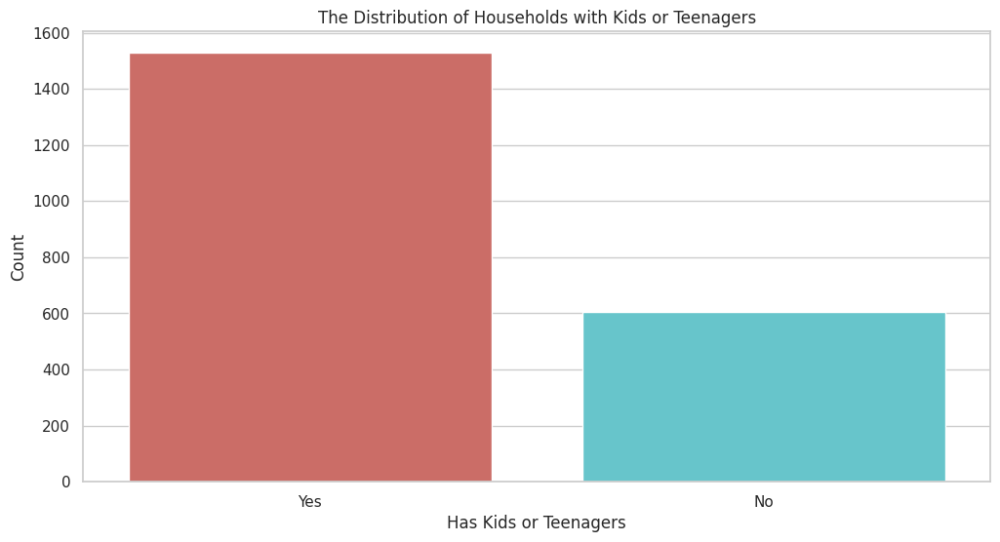

In [51]:
cm=sns.color_palette('hls', len(df['Has_Kids_Teenagers'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Has_Kids_Teenagers'].value_counts().index, y=df['Has_Kids_Teenagers'].value_counts(), palette=cm)
ax.set(xlabel='Has Kids or Teenagers', ylabel='Count', title='The Distribution of Households with Kids or Teenagers')

In [52]:
# Summary statistics for the new column 'Has_Kids_Teenagers'
has_kids_teenagers_summary = df['Has_Kids_Teenagers'].value_counts()
print("Has_Kids_Teenagers Summary:")
print(has_kids_teenagers_summary)

# Contingency table for 'Has_Kids_Teenagers' and 'Response'
contingency_table = pd.crosstab(df['Has_Kids_Teenagers'], df['Response'])
print("\nContingency Table:")
print(contingency_table)

# Chi-square test to check the significance
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print("\nChi-square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)

Has_Kids_Teenagers Summary:
Has_Kids_Teenagers
Yes    1528
No      605
Name: count, dtype: int64

Contingency Table:
Response               0    1
Has_Kids_Teenagers           
No                   447  158
Yes                 1374  154

Chi-square Statistic: 87.98111151485554
p-value: 6.60825012132449e-21
Degrees of Freedom: 1
Expected Frequencies:
[[ 516.50492264   88.49507736]
 [1304.49507736  223.50492264]]


**Justification for creating a new variable 'Has_Kids_Teenagers'**
1. Imbalance Among Values:
- The original columns 'Kidhome' and 'Teenhome' exhibit significant imbalance. Specifically, the value '2' has the smallest frequency. The imbalance can introduce bias into modeling processes, as models may overfit or underfit these rare occurrences.
2. Lack of Clear Age Distinction:
- The dataset does not provide clear age ranges to distinguish between kids and teenagers. This ambiguity can lead to significant errors when summing the 'Kidhone' and 'Teenhome' values, as some respondents may have checked both columns even if they have only one child. This overlap complicates the analysis and increases the risk of inaccuracies.
3. Creating a Simplified Categorical Column:
- To address the isseus of imbalance and overlapping, a new categorical column 'Has_Kids_Teenagers' was created with two values: 'Yes' and 'No'.
 - 'Yes' indicates households with either kids or teenagers.
 - 'No' indicates households with neither kids or teenagers.
4. Statistical Significance:
- The new column 'Has_Kids_Teenagers' shows a statistically significant association with the response variable due to the p-value indicating the presence of kids or teenagers in a household has a meaningful impact on the customers' response.

In [53]:
# Drop 'Kidhome' and 'Teenhome' columns from the dataset
df = df.drop(columns=['Kidhome', 'Teenhome'])

In [54]:
# Dt_Customer: Date of customer's enrollment with the company
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')
df['length']=2024-df['Dt_Customer'].dt.year

In [55]:
df['length'].value_counts()

length
11    1136
10     531
12     466
Name: count, dtype: int64

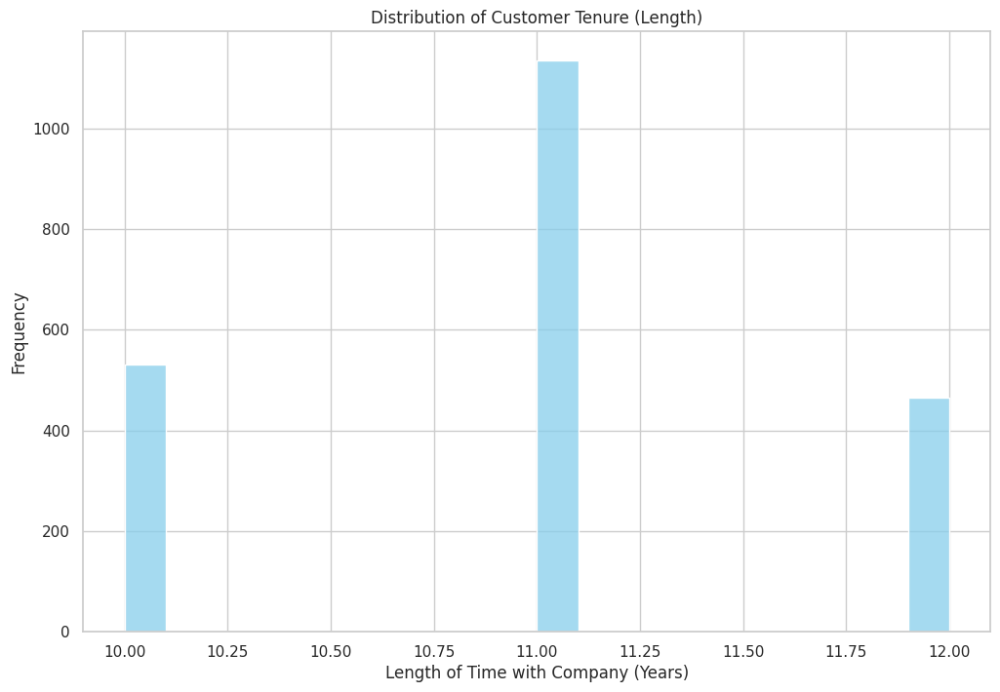

In [56]:
plt.figure(figsize=(12, 8))
sns.histplot(df['length'], bins=20, kde=False, color='skyblue')
plt.title('Distribution of Customer Tenure (Length)')
plt.xlabel('Length of Time with Company (Years)')
plt.ylabel('Frequency')
plt.show()

**The Distribution of Bar Plot**
1. Categories: The bar plot shows three distinct categories for the tenure length: 10years, 11 years, and 12 years.
2. Frequencies:
- 11 years: The highest frequency, with 1136 customers
- 10 years: The next highest frequency with 531 customers
- 12 years: The lowest frequency among the three, with 466 customers.

- This distribution suggests that most customers have been with the company for around 11 years, followed by 10 years and then 12 years. The sharp peak at these sepcific years indicate that a significant portion of the customers base joined the company within a specific time frame, likely around 2012 to 2014.

<ipython-input-57-c81d4ba92016>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['length'], palette='viridis')


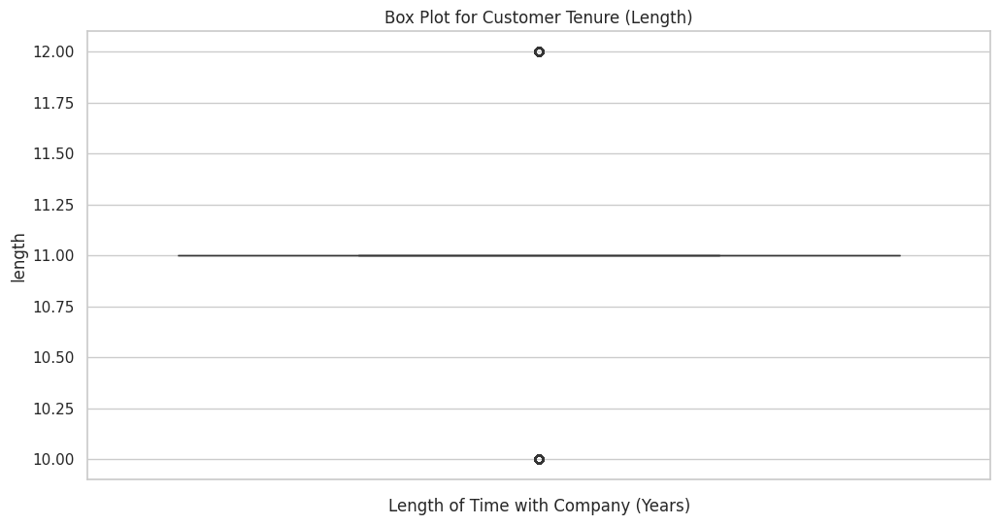

Q1 (25th percentile): 11.0
Median (50th percentile): 11.0
Q3 (75th percentile): 11.0
IQR (Interquartile Range): 0.0
Lower Whisker: 11.0
Upper Whisker: 11.0


In [57]:
plt.figure(figsize=(12, 6))

sns.boxplot(y=df['length'], palette='viridis')
plt.title('Box Plot for Customer Tenure (Length)')
plt.xlabel('Length of Time with Company (Years)')

plt.show()

q1 = df['length'].quantile(0.25)
median = df['length'].quantile(0.50)
q3 = df['length'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

**The Interpretation of Box Plot for 'length' variable.
1. Q1 : 11 years
- 25% of the customers have a tenure of 11 years or less.
2. Median : 11 years
- 50% of the customers have a tenure of 11 years or less.
3. Q3 : 11 years
- 75% of the customers have a tenure of 11 years or less.
4. Box Width:
- The box itself will be extremely narrow or effectively non-existent because Q1, median, and Q3 are all the same.
5. Whiskers are at the same position as the box edges, at 11 years.
6. The lack of variation in tenure length implies that once customers joined during that peak period, they stayed loyal to the company, indicating strong customer retention.

In [58]:
df=df.drop(columns=['Dt_Customer'], axis=1)

<ipython-input-59-a14d9091f965>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumDealsPurchases'].value_counts().index, y=df['NumDealsPurchases'].value_counts(), palette=cm)


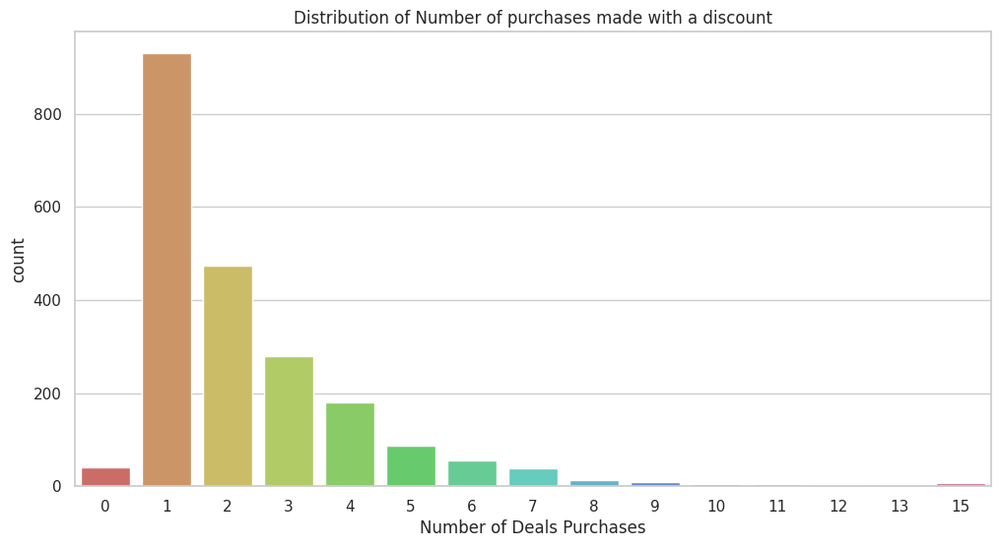

In [59]:
cm=sns.color_palette('hls', len(df['NumDealsPurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumDealsPurchases'].value_counts().index, y=df['NumDealsPurchases'].value_counts(), palette=cm)
ax.set(xlabel='Number of Deals Purchases', ylabel='count', title='Distribution of Number of purchases made with a discount')
plt.show()

<ipython-input-60-3d48532fadfa>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumDealsPurchases'], palette='viridis')


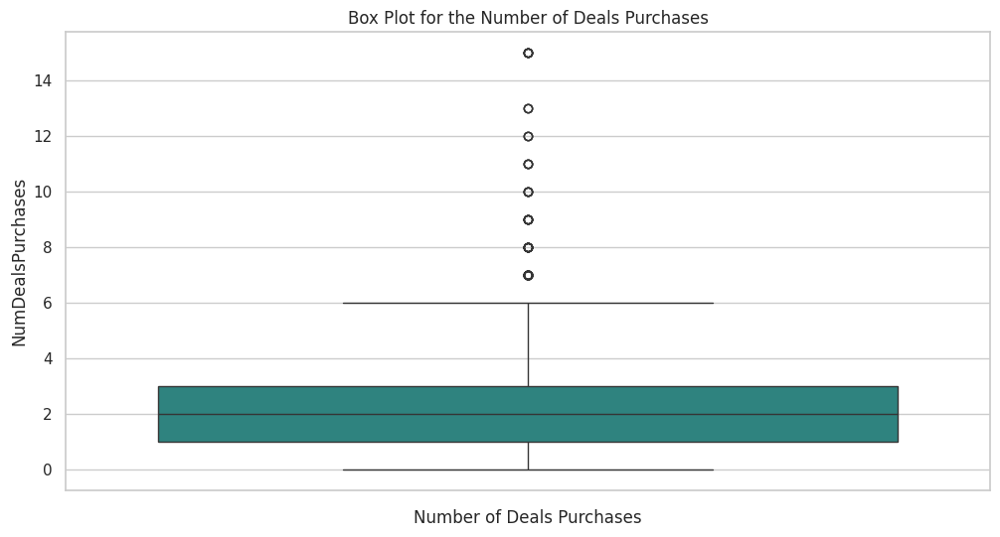

Q1 (25th percentile): 1.0
Median (50th percentile): 2.0
Q3 (75th percentile): 3.0
IQR (Interquartile Range): 2.0
Lower Whisker: -2.0
Upper Whisker: 6.0


In [60]:
# Plotting the Box Plot for 'NumDealsPurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumDealsPurchases'], palette='viridis')
plt.title('Box Plot for the Number of Deals Purchases')
plt.xlabel('Number of Deals Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumDealsPurchases'
q1 = df['NumDealsPurchases'].quantile(0.25)
median = df['NumDealsPurchases'].quantile(0.50)
q3 = df['NumDealsPurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumDealsPurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")


Box Plot of 'NumDealsPurchases' variable.

- Q1 is 1.0 meaning that 25% of customers made 1 or fewer discounted purchases.
- Median is 2.0 indicating that customers made 2 or fewer discounted purchases
- Whiskers indicates that the majority of the purchases made with a discount range between 0 and 6.


<ipython-input-61-e05f85305118>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumWebPurchases'].value_counts().index, y=df['NumWebPurchases'].value_counts(), palette=cm)


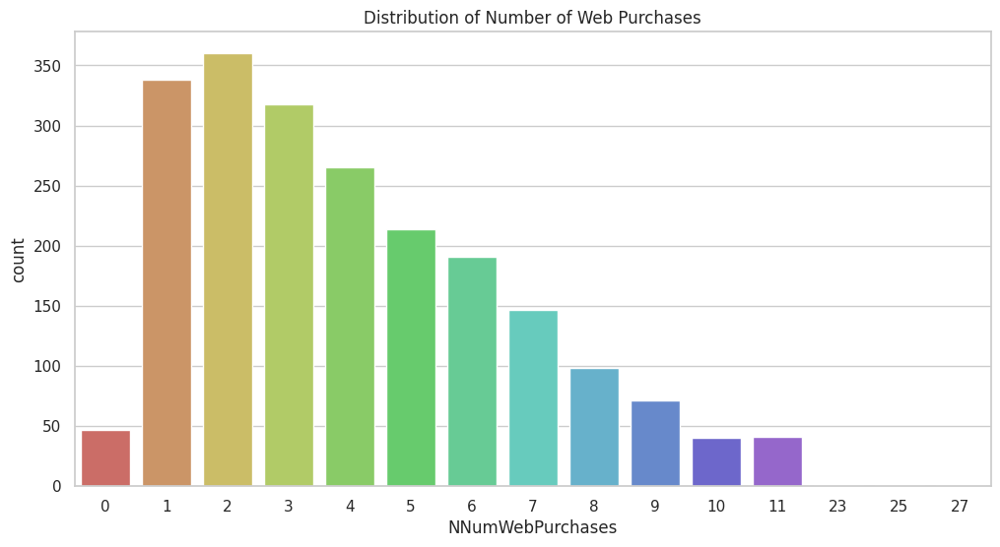

In [61]:
cm=sns.color_palette('hls', len(df['NumWebPurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumWebPurchases'].value_counts().index, y=df['NumWebPurchases'].value_counts(), palette=cm)
ax.set(xlabel='NNumWebPurchases', ylabel='count', title='Distribution of Number of Web Purchases')
plt.show()

<ipython-input-62-f5e04c525c57>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumWebPurchases'], palette='viridis')


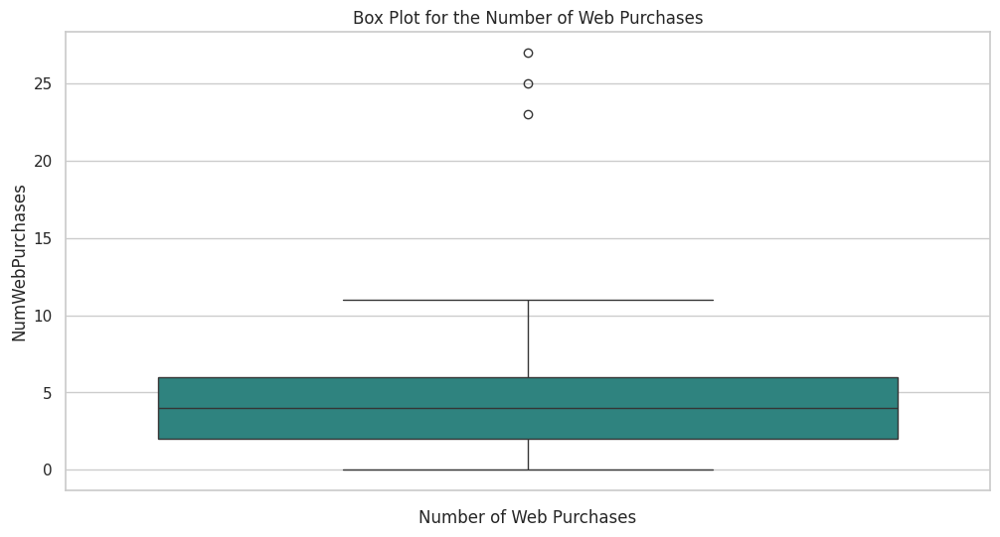

Q1 (25th percentile): 2.0
Median (50th percentile): 4.0
Q3 (75th percentile): 6.0
IQR (Interquartile Range): 4.0
Lower Whisker: -4.0
Upper Whisker: 12.0


In [62]:
# Plotting the Box Plot for 'NumWebPurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumWebPurchases'], palette='viridis')
plt.title('Box Plot for the Number of Web Purchases')
plt.xlabel('Number of Web Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumWebPurchases'
q1 = df['NumWebPurchases'].quantile(0.25)
median = df['NumWebPurchases'].quantile(0.50)
q3 = df['NumWebPurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumWebPurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")


<ipython-input-63-5af4a949e5fb>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumCatalogPurchases'].value_counts().index, y=df['NumCatalogPurchases'].value_counts(), palette=cm)


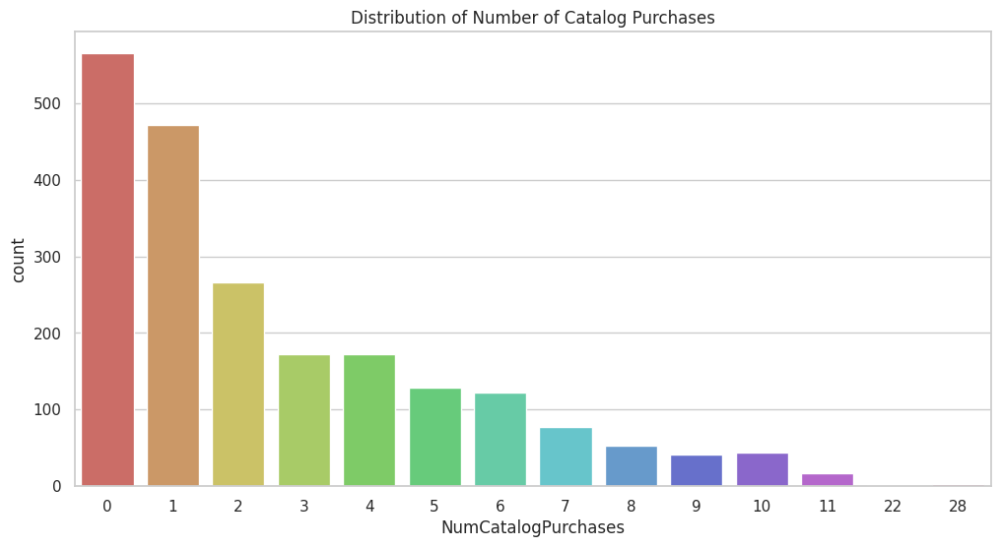

In [63]:
cm=sns.color_palette('hls', len(df['NumCatalogPurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumCatalogPurchases'].value_counts().index, y=df['NumCatalogPurchases'].value_counts(), palette=cm)
ax.set(xlabel='NumCatalogPurchases', ylabel='count', title='Distribution of Number of Catalog Purchases')
plt.show()

<ipython-input-64-8c190430ef48>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')


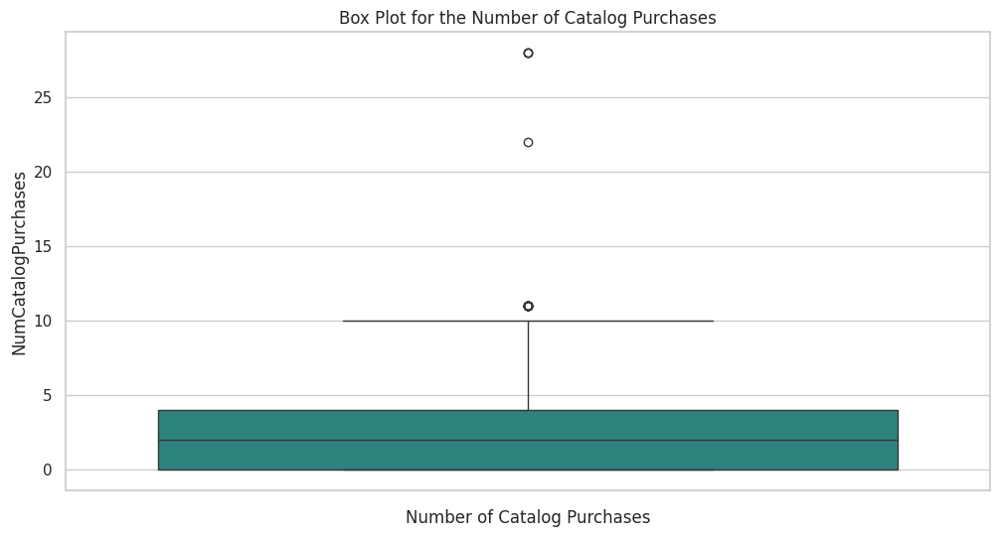

Q1 (25th percentile): 0.0
Median (50th percentile): 2.0
Q3 (75th percentile): 4.0
IQR (Interquartile Range): 4.0
Lower Whisker: -6.0
Upper Whisker: 10.0


In [64]:
# Plotting the Box Plot for 'NumCatalogPurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')
plt.title('Box Plot for the Number of Catalog Purchases')
plt.xlabel('Number of Catalog Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumCatalogPurchases'
q1 = df['NumCatalogPurchases'].quantile(0.25)
median = df['NumCatalogPurchases'].quantile(0.50)
q3 = df['NumCatalogPurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumCatalogPurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-65-cb80c6c1f32b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumStorePurchases'].value_counts().index, y=df['NumStorePurchases'].value_counts(), palette=cm)


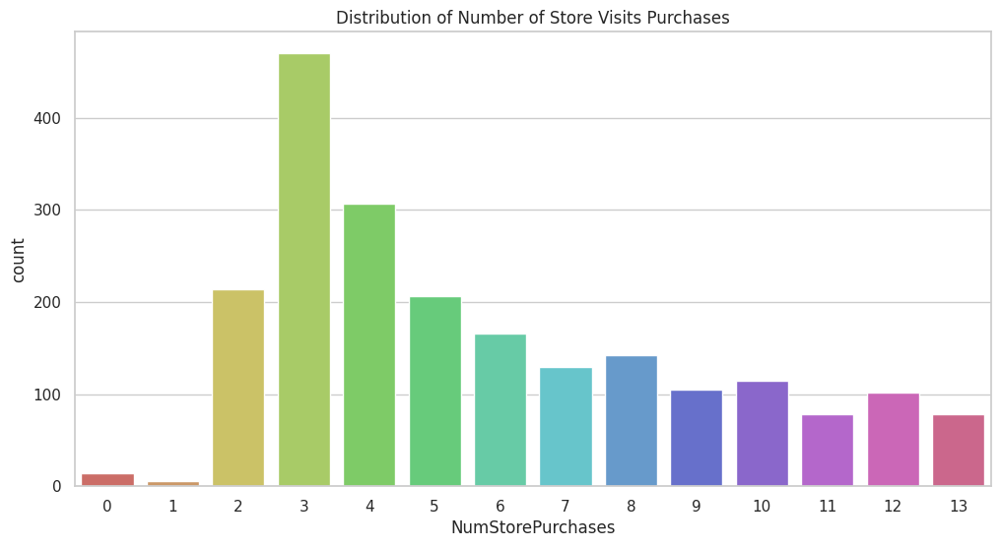

In [65]:
cm=sns.color_palette('hls', len(df['NumStorePurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumStorePurchases'].value_counts().index, y=df['NumStorePurchases'].value_counts(), palette=cm)
ax.set(xlabel='NumStorePurchases', ylabel='count', title='Distribution of Number of Store Visits Purchases')
plt.show()

<ipython-input-66-296a0c781df3>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumStorePurchases'], palette='viridis')


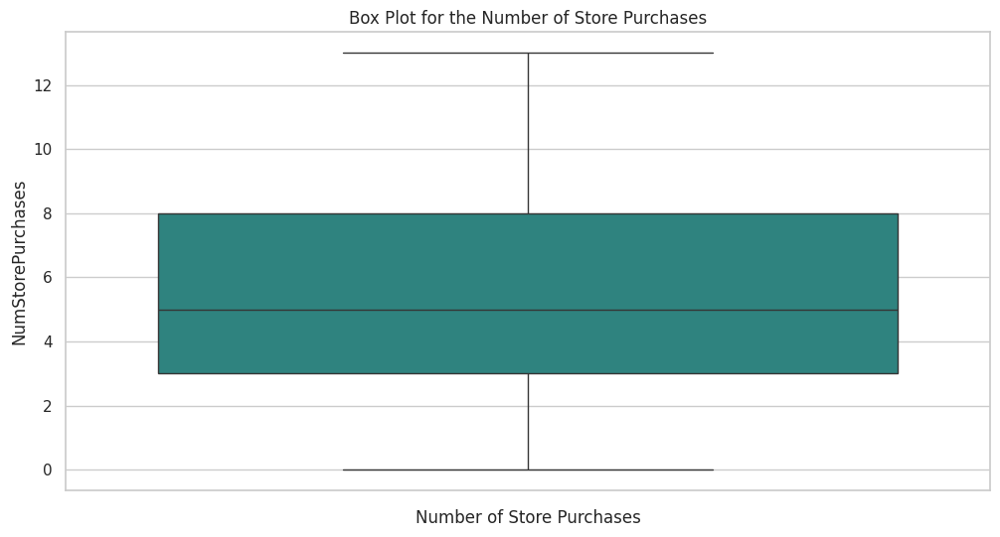

Q1 (25th percentile): 3.0
Median (50th percentile): 5.0
Q3 (75th percentile): 8.0
IQR (Interquartile Range): 5.0
Lower Whisker: -4.5
Upper Whisker: 15.5


In [66]:
# Plotting the Box Plot for 'NumStorePurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumStorePurchases'], palette='viridis')
plt.title('Box Plot for the Number of Store Purchases')
plt.xlabel('Number of Store Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumStorePurchases'
q1 = df['NumStorePurchases'].quantile(0.25)
median = df['NumStorePurchases'].quantile(0.50)
q3 = df['NumStorePurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumStorePurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-67-fdaa62211051>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumWebVisitsMonth'].value_counts().index, y=df['NumWebVisitsMonth'].value_counts(), palette=cm)


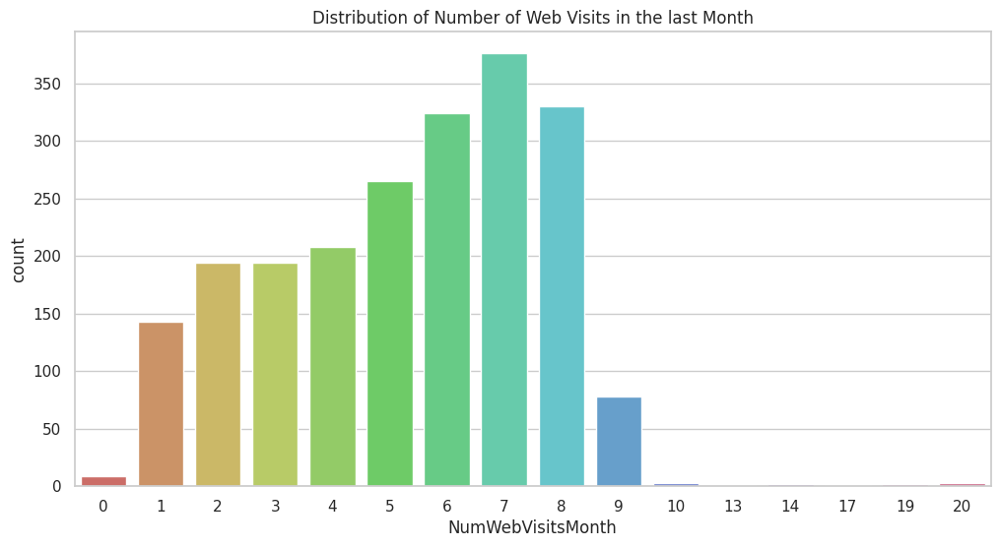

In [67]:
cm=sns.color_palette('hls', len(df['NumWebVisitsMonth'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumWebVisitsMonth'].value_counts().index, y=df['NumWebVisitsMonth'].value_counts(), palette=cm)
ax.set(xlabel='NumWebVisitsMonth', ylabel='count', title='Distribution of Number of Web Visits in the last Month')
plt.show()

<ipython-input-68-acee04f2fc3b>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumWebVisitsMonth'], palette='viridis')


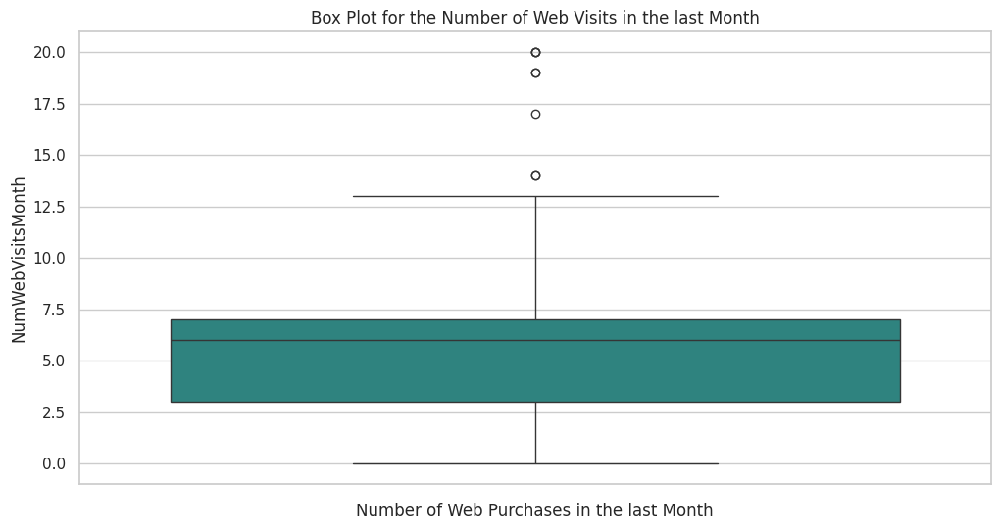

Q1 (25th percentile): 3.0
Median (50th percentile): 6.0
Q3 (75th percentile): 7.0
IQR (Interquartile Range): 4.0
Lower Whisker: -3.0
Upper Whisker: 13.0


In [68]:
# Plotting the Box Plot for 'NumWebVisitsMonth'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumWebVisitsMonth'], palette='viridis')
plt.title('Box Plot for the Number of Web Visits in the last Month')
plt.xlabel('Number of Web Purchases in the last Month')
plt.show()

# Calculating Quartiles and IQR for 'NumWebVisitsMonth'
q1 = df['NumWebVisitsMonth'].quantile(0.25)
median = df['NumWebVisitsMonth'].quantile(0.50)
q3 = df['NumWebVisitsMonth'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumWebVisitsMonth'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-69-1938cc0ccd33>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumWebPurchases'], palette='viridis')
<ipython-input-69-1938cc0ccd33>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')
<ipython-input-69-1938cc0ccd33>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumStorePurchases'], palette='viridis')
<ipython-input-69-1938cc0ccd33>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable 

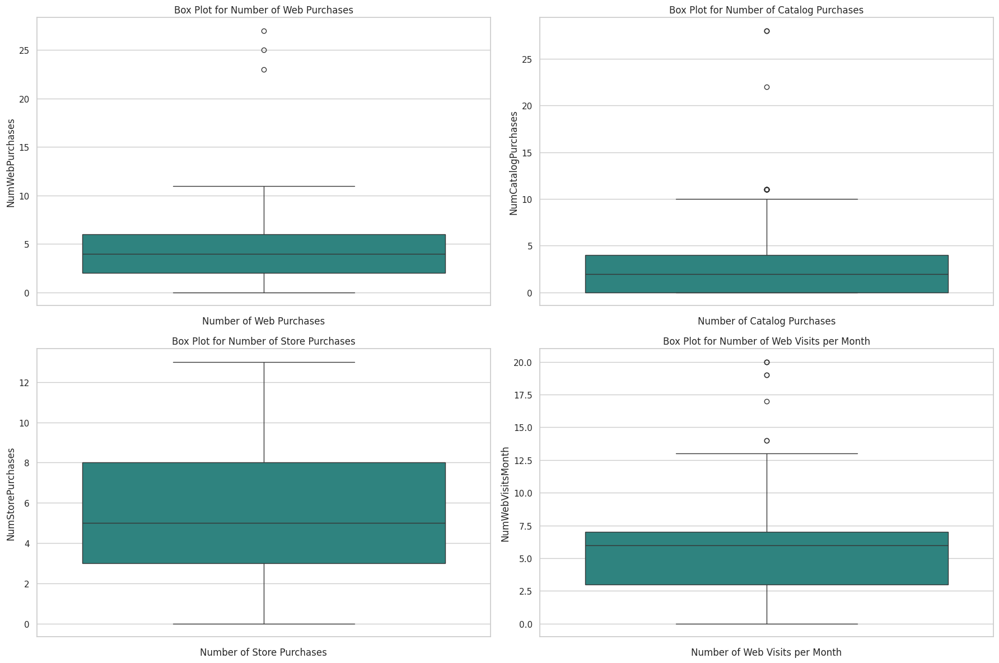

In [69]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
sns.boxplot(y=df['NumWebPurchases'], palette='viridis')
plt.title('Box Plot for Number of Web Purchases')
plt.xlabel('Number of Web Purchases')

plt.subplot(2, 2, 2)
sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')
plt.title('Box Plot for Number of Catalog Purchases')
plt.xlabel('Number of Catalog Purchases')

plt.subplot(2, 2, 3)
sns.boxplot(y=df['NumStorePurchases'], palette='viridis')
plt.title('Box Plot for Number of Store Purchases')
plt.xlabel('Number of Store Purchases')

plt.subplot(2, 2, 4)
sns.boxplot(y=df['NumWebVisitsMonth'], palette='viridis')
plt.title('Box Plot for Number of Web Visits per Month')
plt.xlabel('Number of Web Visits per Month')

plt.tight_layout()
plt.show()

**Disparity between Website Traffic and Online Purchases**
- There is a disparity betwen website traffic and online purchases. The higher number of website visits in the last month indicates the number of people visiting the website is growing, but it does not increase the conversion rate of online purchases.

**Preference for In-Store Shopping**
- The box plot for 'NumStorePurchases' shows higher median and upper quartiles compared to other methods for purchases suggest that customers still prefer in-store shoppings.

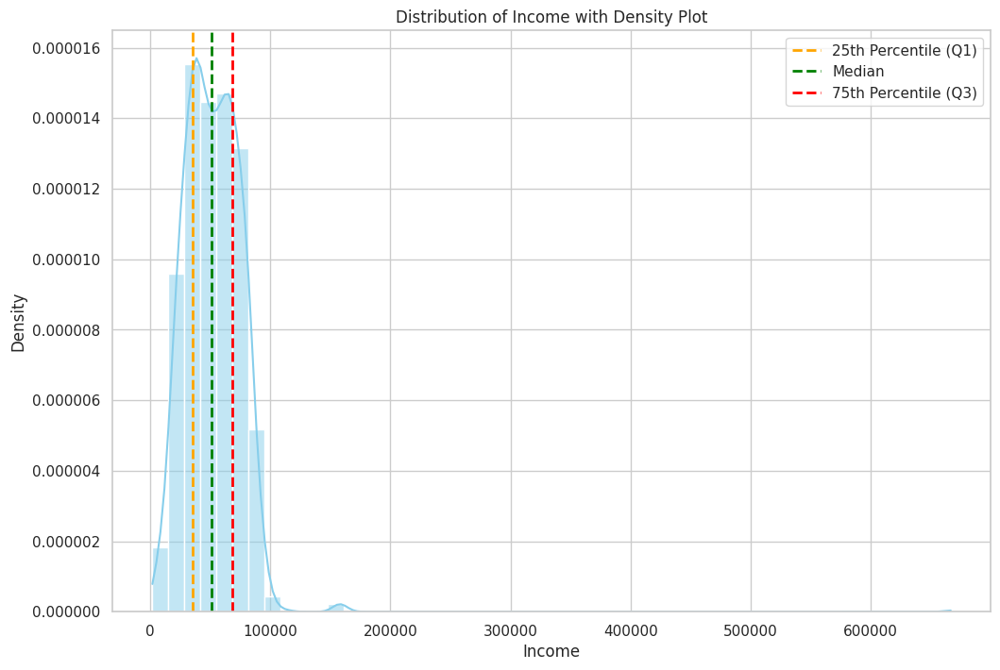

In [70]:
# Calculate quartiles
q1 = df['Income'].quantile(0.25)
median = df['Income'].quantile(0.50)
q3 = df['Income'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Create a figure with subplots
plt.figure(figsize=(12, 8))
sns.histplot(df['Income'], stat="density", kde=True, bins=50, color='skyblue')  # Adjust aspect ratio and use histplot for continuous data

# Plot quartile lines
plt.axvline(q1, color='orange', linestyle='dashed', linewidth=2, label='25th Percentile (Q1)')
plt.axvline(median, color='green', linestyle='dashed', linewidth=2, label='Median')
plt.axvline(q3, color='red', linestyle='dashed', linewidth=2, label='75th Percentile (Q3)')

# Formatting the plot
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Income with Density Plot')
plt.xlabel('Income')
plt.ylabel('Density')
plt.legend()



<ipython-input-71-d656ffd720dc>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['Income'], palette='viridis')


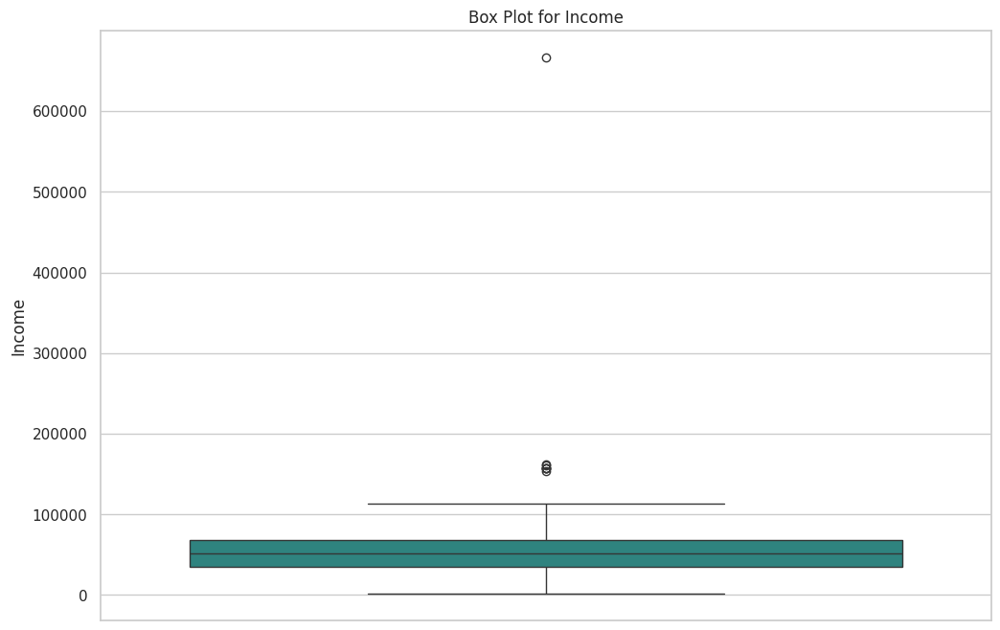

Q1 (25th percentile): 34941.0
Median (50th percentile): 51141.0
Q3 (75th percentile): 68487.0
IQR (Interquartile Range): 33546.0
Lower Whisker: -15378.0
Upper Whisker: 118806.0


In [71]:
# Calculate quartiles
q1 = df['Income'].quantile(0.25)
median = df['Income'].quantile(0.50)
q3 = df['Income'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Plotting the Box Plot for Income
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['Income'], palette='viridis')

# Adding titles and labels
plt.title('Box Plot for Income')
plt.ylabel('Income')
plt.xlabel('')

# Show plot
plt.show()

# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

**Income distribution Insights**
- Compared to typical heavily right-skewed income distribution, the income distribution of this dataset has shown a more balanced distribution with significant number of middle-class individuals. The income for the half of customers ranges from \$35,303 to \$68,522 that might be considered as middle-class income and the median income is \$51,381.

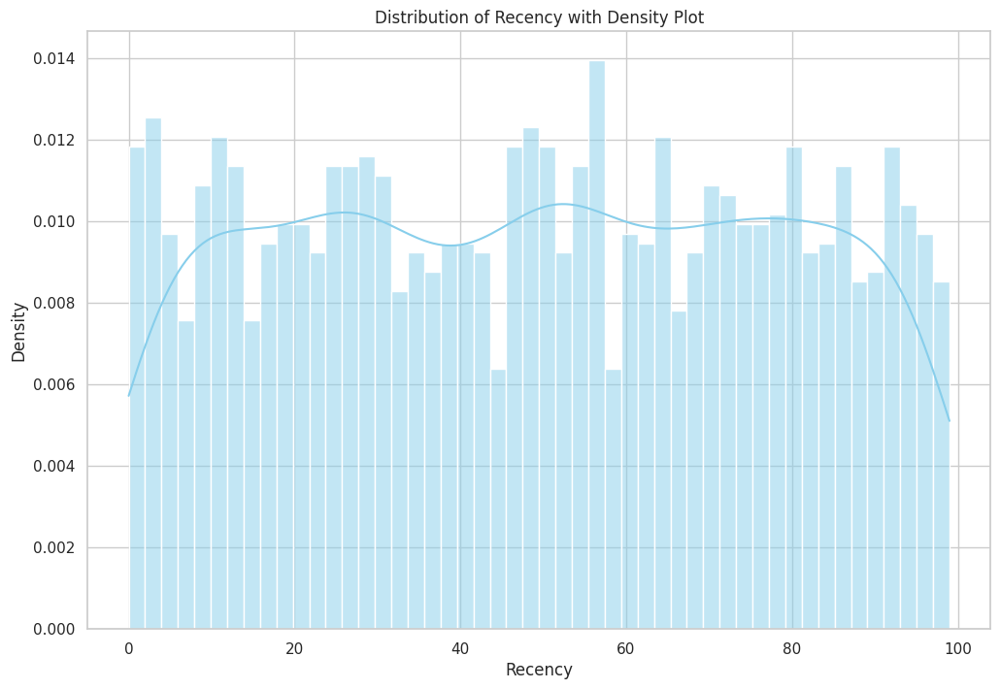

In [72]:
plt.figure(figsize=(12, 8))
sns.histplot(df['Recency'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Recency with Density Plot')
plt.xlabel('Recency')
plt.ylabel('Density')
plt.show()

**Characteristics of the Distribution of Recency:**
1. Lack of typical patterns:
- There is any clear peaks or patterns on the bar plot indicating there is not dominant recency values where most customers are clustered.
- Instead, the recency values are spread out across a wide range, suggesting diverse customer behavior.
2. Varied Distribution:
- The heights of the bars vary significantly, showing that customers have made their last purchases at many different times rather than clustering around a few sepcific recency values.

<ipython-input-73-bdb98dafbe5c>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['Recency'], palette='viridis')


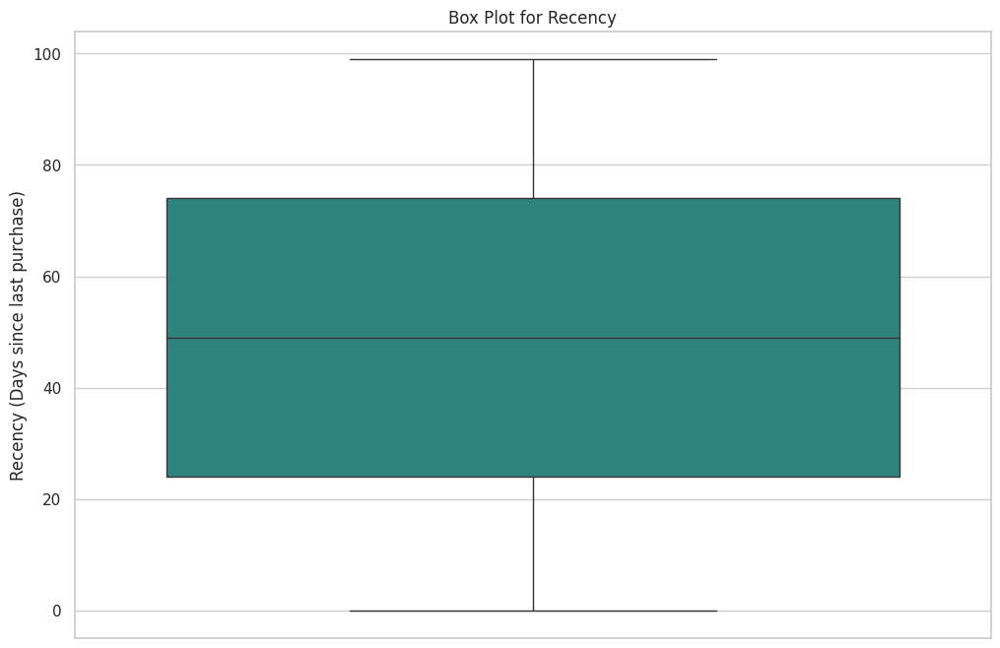

Q1 (25th percentile): 24.0
Median (50th percentile): 49.0
Q3 (75th percentile): 74.0
IQR (Interquartile Range): 50.0
Lower Whisker: -51.0
Upper Whisker: 149.0


In [73]:
# Calculate quartiles
q1 = df['Recency'].quantile(0.25)
median = df['Recency'].quantile(0.50)
q3 = df['Recency'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

plt.figure(figsize=(12, 8))
sns.boxplot(y=df['Recency'], palette='viridis')
plt.title('Box Plot for Recency')
plt.ylabel('Recency (Days since last purchase)')
plt.xlabel('')
plt.show()

# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

**The Interpretation for the Box Plot for Recency**
1. Q1: 24.0
- 25% of the customers made their last purchase within the last 24 days.
- This result indicated the quarter of the customer base has very recent purchase activity.
2. Median: 49.0
- 50% of the customers made their last purchase within the last 49 days.
- The medain recency is 49 days, indicating that the typical customer last purchased about a month and a half ago.
3. The box spans from Q1 (24 days) to Q3 (74 days), indicating that the middle 50% of customers made their last purchase within the last 50-day range.
4. A wider box width that the middle 50% of the customeres hvae a wide range of recency values, suggesting varied engagement patterns.

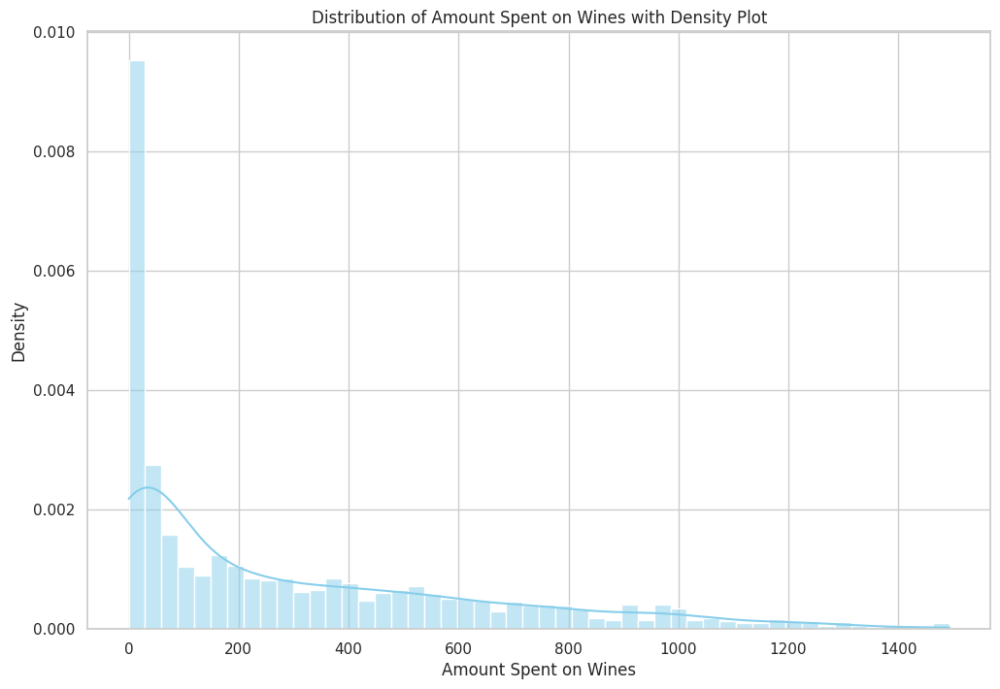

In [74]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntWines'], stat="density", kde=True, bins=50, color='skyblue')  # Use histplot for single plot
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount Spent on Wines with Density Plot')
plt.xlabel('Amount Spent on Wines')
plt.ylabel('Density')
plt.show()

<ipython-input-75-3692707bfa61>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntWines'], palette='viridis')


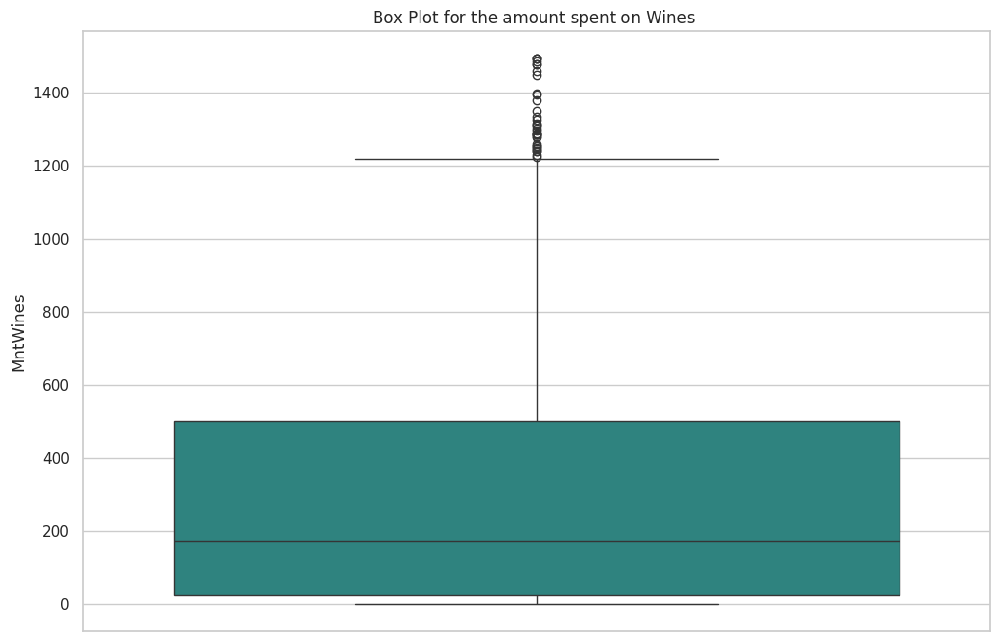

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [75]:
# Calculate quartiles
q1 = df['MntWines'].quantile(0.25)
median = df['MntWines'].quantile(0.50)
q3 = df['MntWines'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Plotting the Box Plot for Income
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntWines'], palette='viridis')

# Adding titles and labels
plt.title('Box Plot for the amount spent on Wines ')
plt.ylabel('MntWines')
plt.xlabel('')

# Show plot
plt.show()

# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

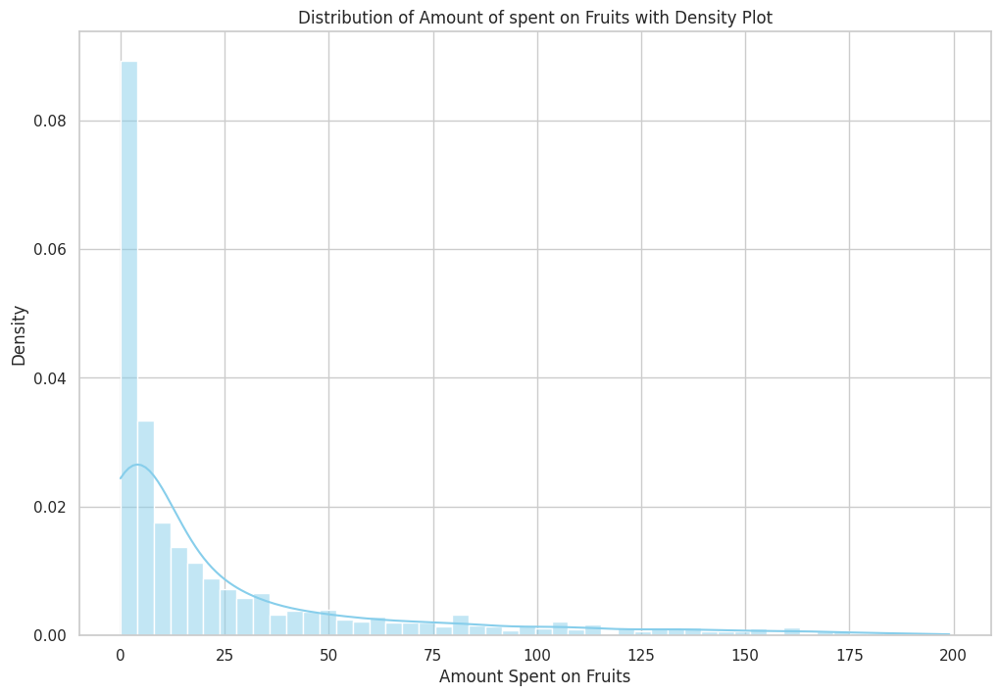

In [76]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntFruits'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Fruits with Density Plot')
plt.xlabel('Amount Spent on Fruits')
plt.ylabel('Density')
plt.show()

<ipython-input-77-d573c03a2269>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntFruits'], palette='viridis')


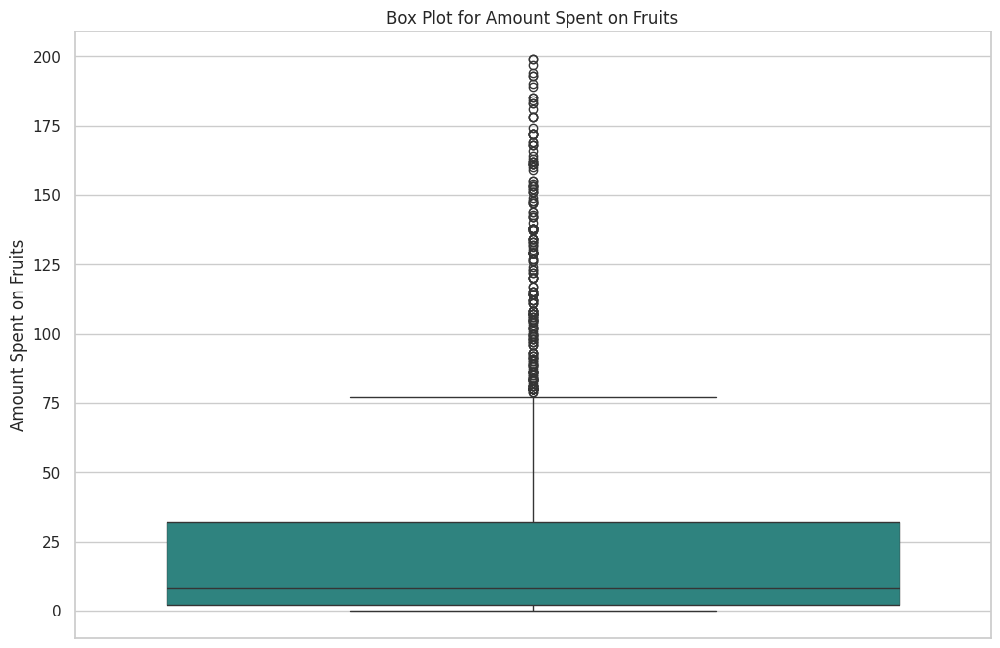

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [77]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntFruits'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fruits')
plt.ylabel('Amount Spent on Fruits')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

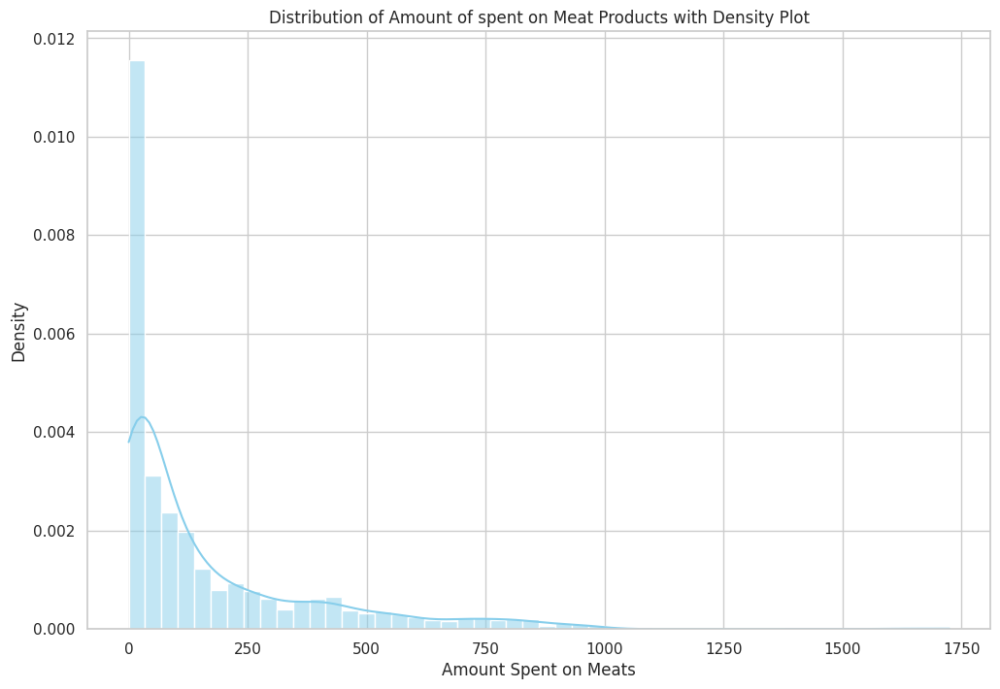

In [78]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntMeatProducts'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Meat Products with Density Plot')
plt.xlabel('Amount Spent on Meats')
plt.ylabel('Density')
plt.show()

<ipython-input-79-69735651005d>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntMeatProducts'], palette='viridis')


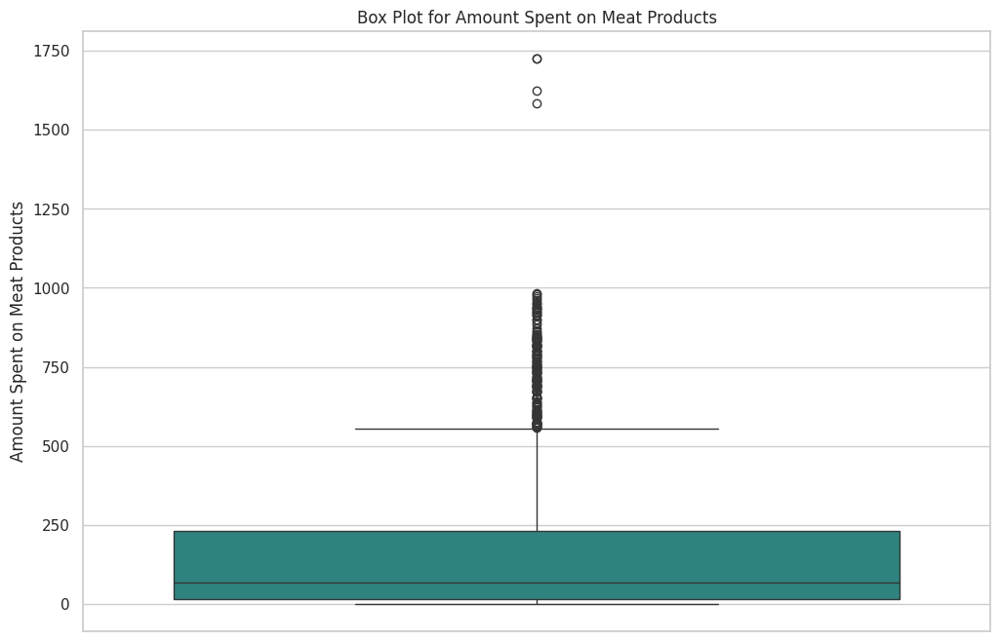

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [79]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntMeatProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Meat Products')
plt.ylabel('Amount Spent on Meat Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

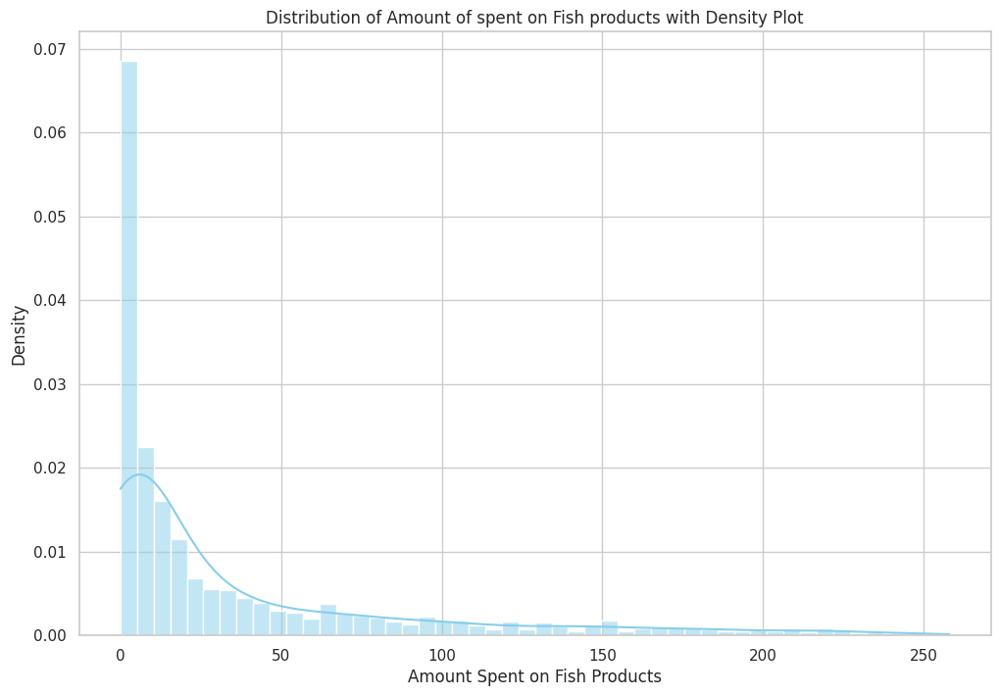

In [80]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntFishProducts'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Fish products with Density Plot')
plt.xlabel('Amount Spent on Fish Products')
plt.ylabel('Density')
plt.show()

<ipython-input-81-e4216f28f38f>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntFishProducts'], palette='viridis')


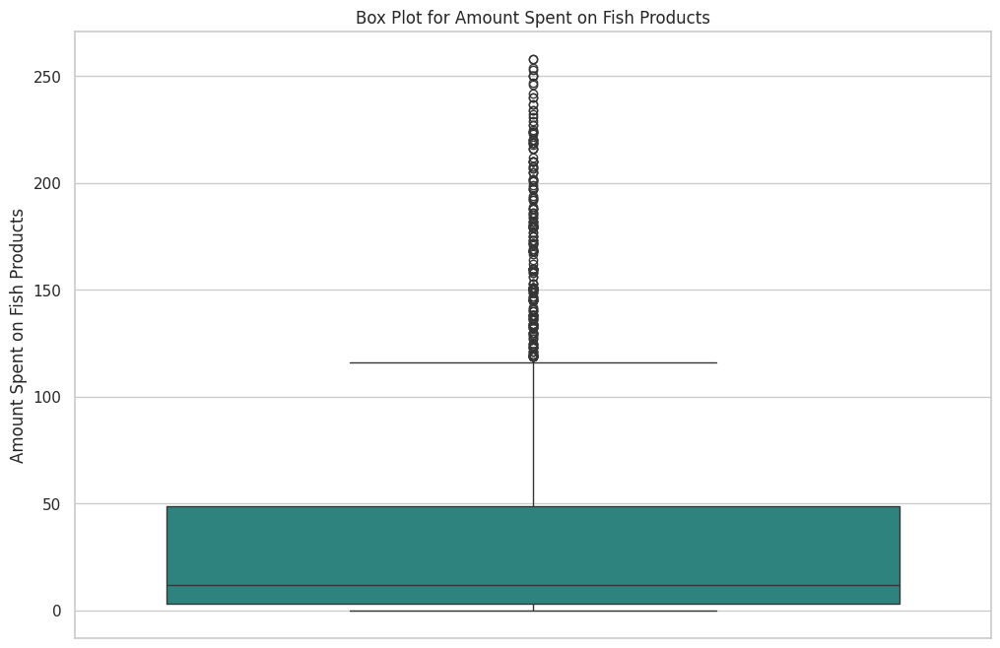

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [81]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntFishProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fish Products')
plt.ylabel('Amount Spent on Fish Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

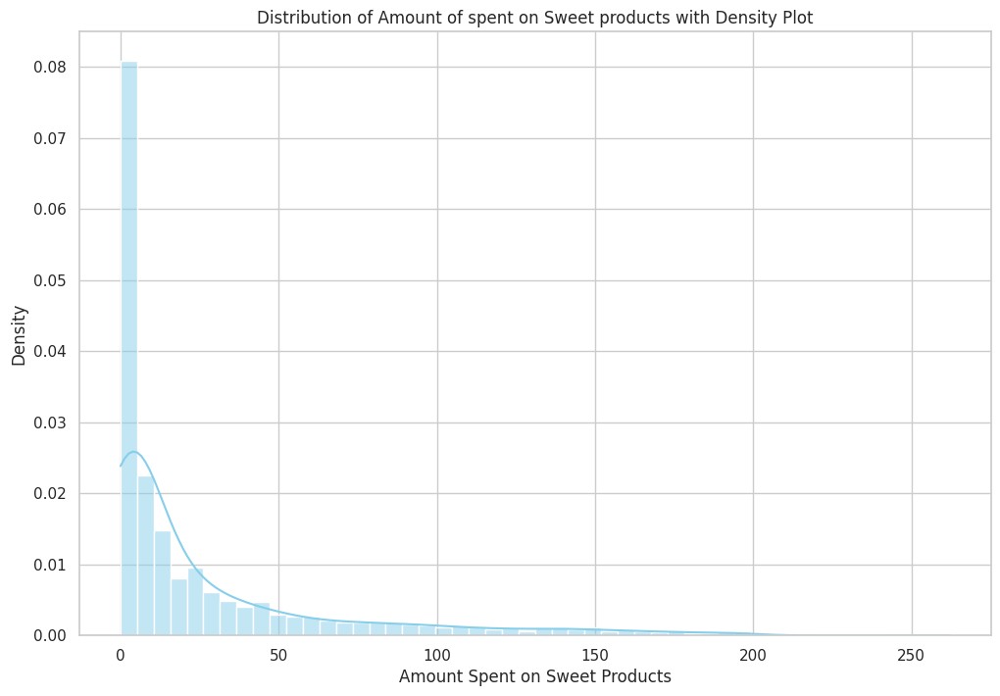

In [82]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntSweetProducts'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Sweet products with Density Plot')
plt.xlabel('Amount Spent on Sweet Products')
plt.ylabel('Density')
plt.show()

<ipython-input-83-d7da45ddc4f4>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntSweetProducts'], palette='viridis')


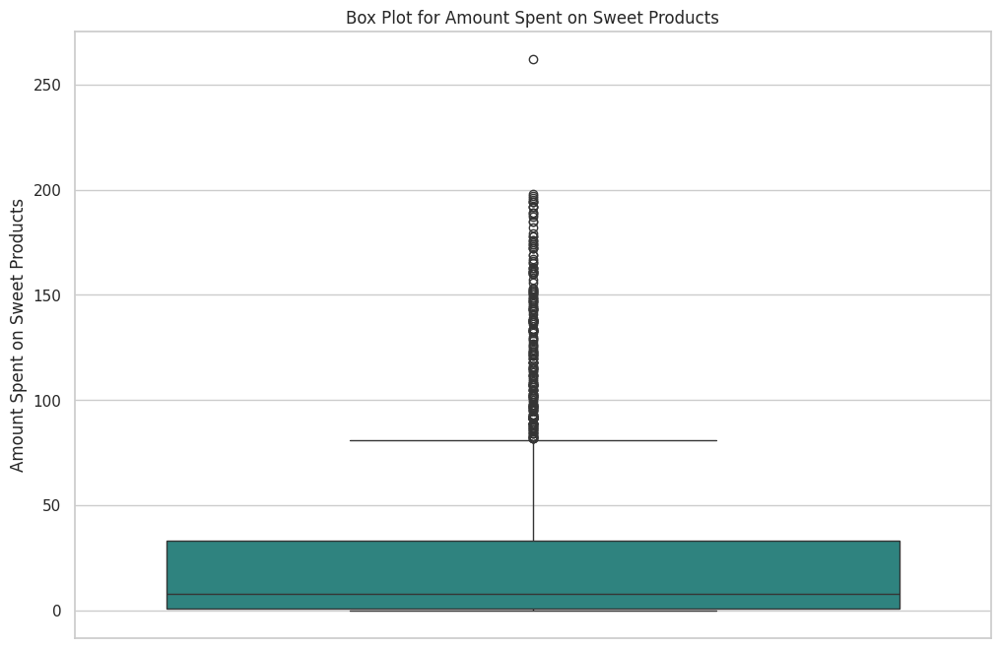

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [83]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntSweetProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Sweet Products')
plt.ylabel('Amount Spent on Sweet Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

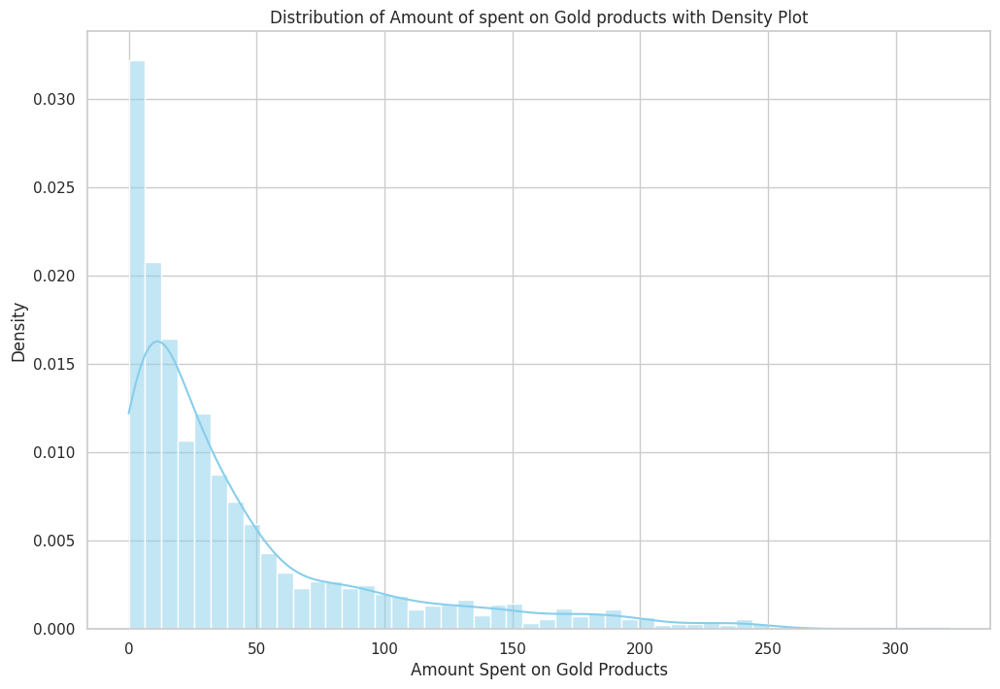

In [84]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntGoldProds'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Gold products with Density Plot')
plt.xlabel('Amount Spent on Gold Products')
plt.ylabel('Density')
plt.show()

<ipython-input-85-a9a0ddf1e696>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntGoldProds'], palette='viridis')


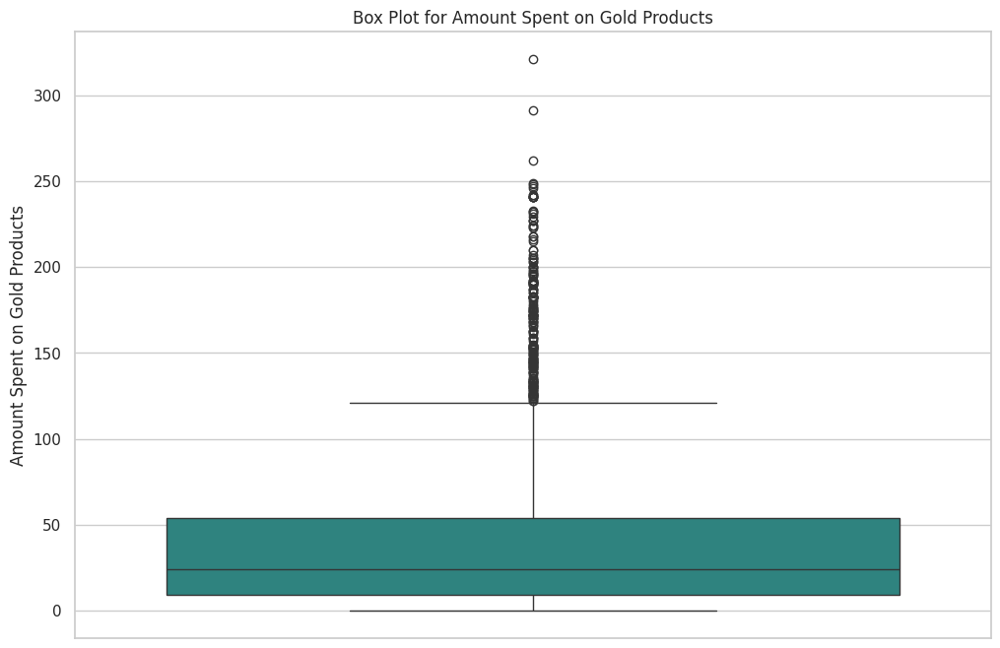

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [85]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntGoldProds'], palette='viridis')
plt.title('Box Plot for Amount Spent on Gold Products')
plt.ylabel('Amount Spent on Gold Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-86-cdb00d0d7bb8>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntWines'], palette='viridis')
<ipython-input-86-cdb00d0d7bb8>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntFruits'], palette='viridis')
<ipython-input-86-cdb00d0d7bb8>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntMeatProducts'], palette='viridis')
<ipython-input-86-cdb00d0d7bb8>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `

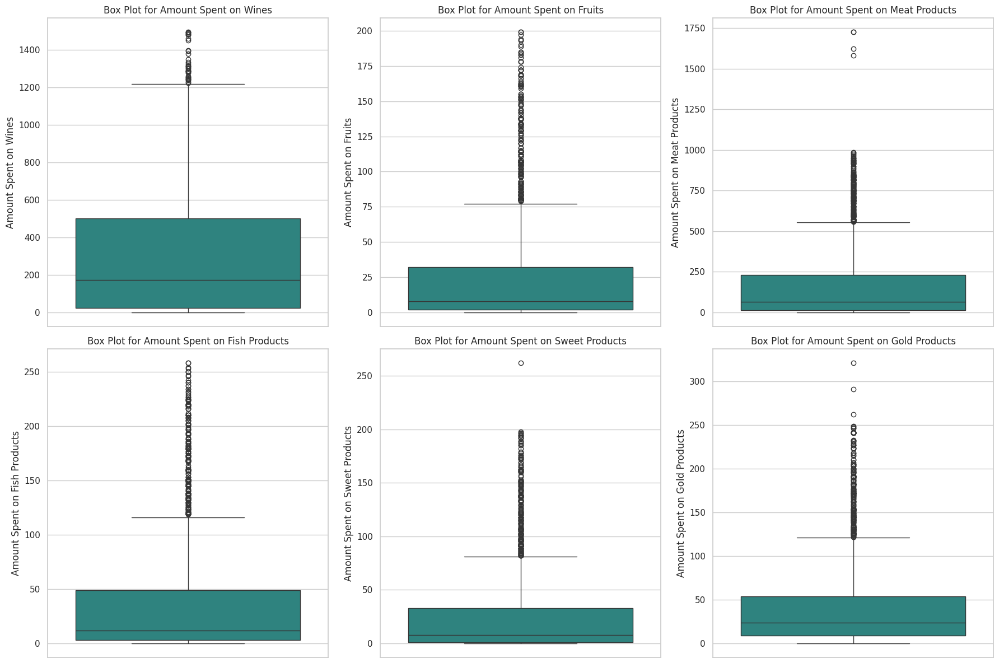

In [86]:
# Plotting the Box Plots for Various Spending Categories
plt.figure(figsize=(18, 12))  # Set figure size

# Subplot for each category
plt.subplot(2, 3, 1)
sns.boxplot(y=df['MntWines'], palette='viridis')
plt.title('Box Plot for Amount Spent on Wines')
plt.ylabel('Amount Spent on Wines')
plt.xlabel('')

plt.subplot(2, 3, 2)
sns.boxplot(y=df['MntFruits'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fruits')
plt.ylabel('Amount Spent on Fruits')
plt.xlabel('')

plt.subplot(2, 3, 3)
sns.boxplot(y=df['MntMeatProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Meat Products')
plt.ylabel('Amount Spent on Meat Products')
plt.xlabel('')

plt.subplot(2, 3, 4)
sns.boxplot(y=df['MntFishProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fish Products')
plt.ylabel('Amount Spent on Fish Products')
plt.xlabel('')

plt.subplot(2, 3, 5)
sns.boxplot(y=df['MntSweetProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Sweet Products')
plt.ylabel('Amount Spent on Sweet Products')
plt.xlabel('')

plt.subplot(2, 3, 6)
sns.boxplot(y=df['MntGoldProds'], palette='viridis')
plt.title('Box Plot for Amount Spent on Gold Products')
plt.ylabel('Amount Spent on Gold Products')
plt.xlabel('')

# Adjust layout
plt.tight_layout()
plt.show()



- Both histograms and box plots for all these products have shown right-skewness with longer-tails and upper whiskers.
- Most Spending is concentrated at lower values for each category with fewer instances of very high spending.
- The median for Wines is higher than other categories indicating that a significant amount of budget was spent on wines.
- The interquartile range of Wines is wider than the other categories suggesting that there is consierable variability in spending on wines.

In [87]:
spend_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
df['spend'] = df[spend_columns].sum(axis=1)

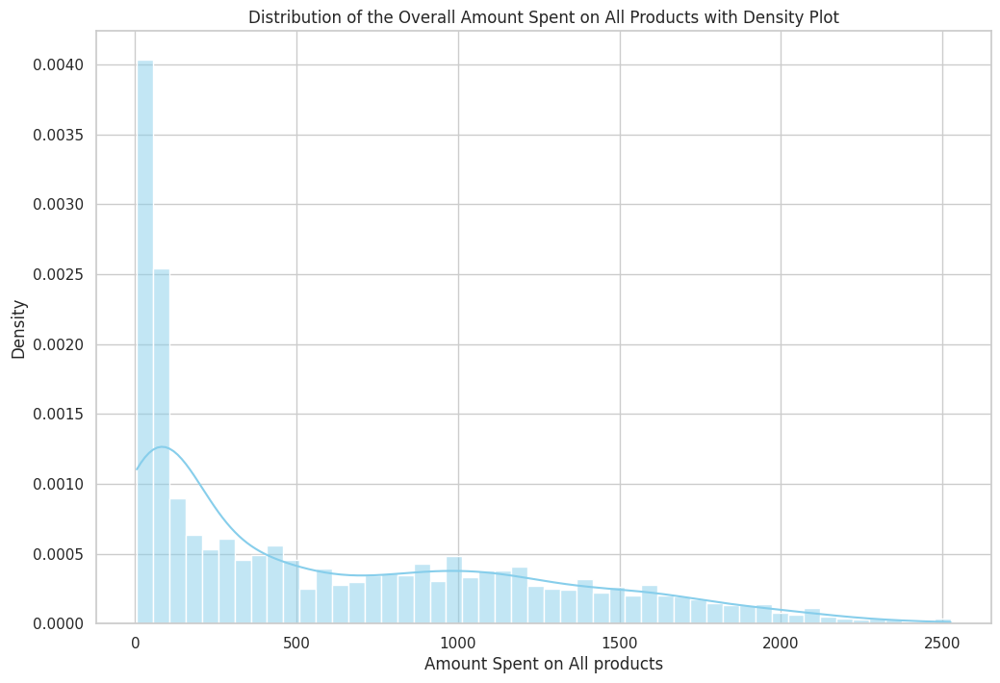

In [88]:
plt.figure(figsize=(12, 8))
sns.histplot(df['spend'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of the Overall Amount Spent on All Products with Density Plot')
plt.xlabel('Amount Spent on All products')
plt.ylabel('Density')
plt.show()

<ipython-input-89-f9d2130f7198>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['spend'], palette='viridis')


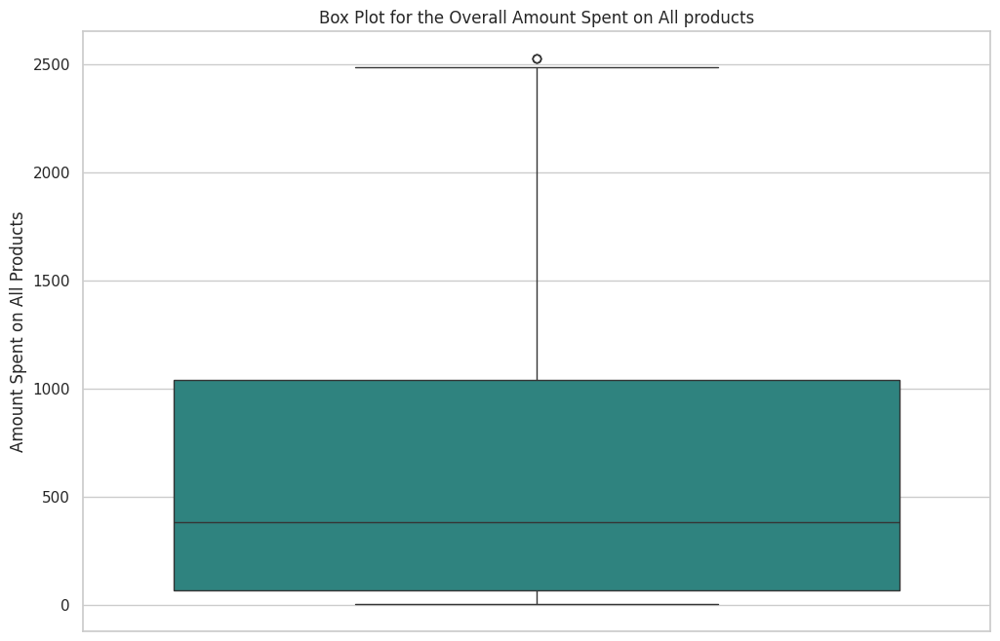

Q1 (25th percentile): 23.0
Median (50th percentile): 172.0
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [89]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['spend'], palette='viridis')
plt.title('Box Plot for the Overall Amount Spent on All products')
plt.ylabel('Amount Spent on All Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

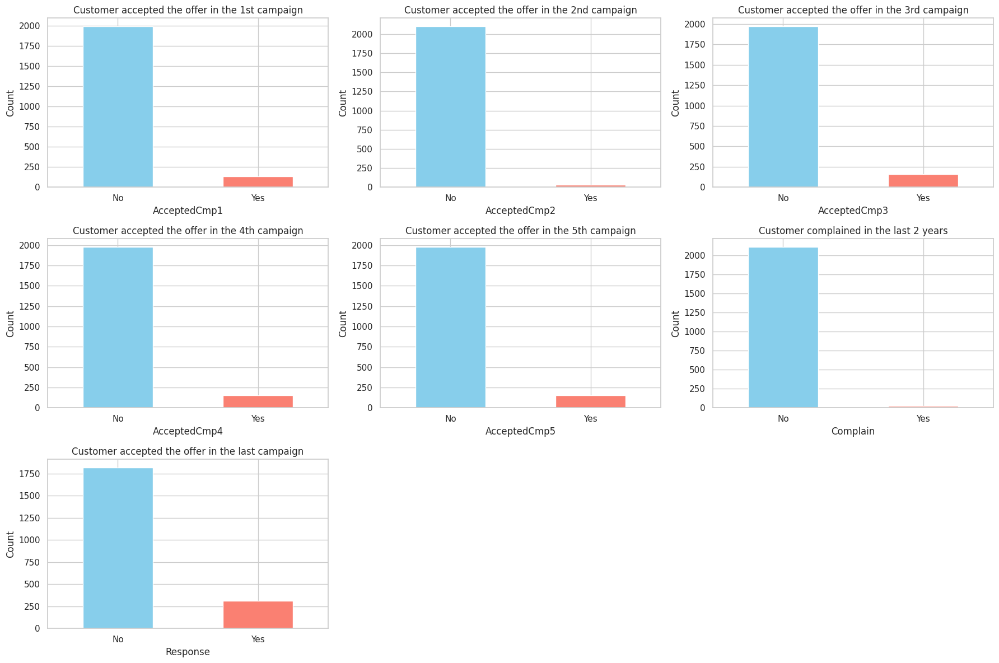

In [90]:
binary_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Response']
custom_titles = {
     'AcceptedCmp1': 'Customer accepted the offer in the 1st campaign',
    'AcceptedCmp2': 'Customer accepted the offer in the 2nd campaign',
    'AcceptedCmp3': 'Customer accepted the offer in the 3rd campaign',
    'AcceptedCmp4': 'Customer accepted the offer in the 4th campaign',
    'AcceptedCmp5': 'Customer accepted the offer in the 5th campaign',
    'Complain': 'Customer complained in the last 2 years',
    'Response': 'Customer accepted the offer in the last campaign'}

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(18, 12))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each binary column
for i, col in enumerate(binary_columns):
    title = custom_titles.get(col, col)
    ax = df[col].value_counts().plot(kind='bar', ax=axes[i], title=title, color=['skyblue', 'salmon'])
    ax.set(ylabel='Count')
    ax.set_xticklabels(['No', 'Yes'], rotation=0)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [91]:
# List of campaign columns
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']

# Create a new column 'AnyAcceptedCmp' which is 1 if any of the campaign columns is 1, otherwise 0
df['AnyAcceptedCmp'] = df[campaign_columns].max(axis=1)

<ipython-input-92-b40a0eb438b7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['AnyAcceptedCmp'].value_counts().index, y=df['AnyAcceptedCmp'].value_counts(), palette=['salmon', 'skyblue'])
<ipython-input-92-b40a0eb438b7>:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['No', 'Yes'])


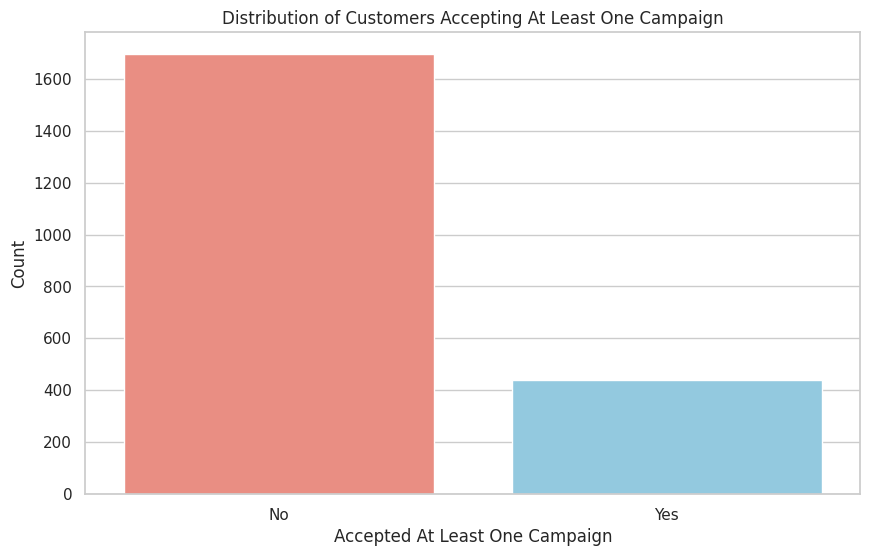

In [92]:
# Plotting the bar plot for 'AnyAcceptedCmp'
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=df['AnyAcceptedCmp'].value_counts().index, y=df['AnyAcceptedCmp'].value_counts(), palette=['salmon', 'skyblue'])
ax.set_xticklabels(['No', 'Yes'])
plt.title('Distribution of Customers Accepting At Least One Campaign')
plt.xlabel('Accepted At Least One Campaign')
plt.ylabel('Count')
plt.show()

In [93]:
# Summary statistics for the new column 'AnyAcceptedCmp'
any_accepted_cmp_summary = df['AnyAcceptedCmp'].value_counts()
print("AnyAcceptedCmp Summary:")
print(any_accepted_cmp_summary)

# Contingency table for 'AnyAcceptedCmp' and 'Response'
contingency_table = pd.crosstab(df['AnyAcceptedCmp'], df['Response'])
print("\nContingency Table:")
print(contingency_table)

# Chi-square test to check the significance
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print("\nChi-square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)

AnyAcceptedCmp Summary:
AnyAcceptedCmp
0    1694
1     439
Name: count, dtype: int64

Contingency Table:
Response           0    1
AnyAcceptedCmp           
0               1557  137
1                264  175

Chi-square Statistic: 279.365374412018
p-value: 1.0325060352076027e-62
Degrees of Freedom: 1
Expected Frequencies:
[[1446.2137834  247.7862166]
 [ 374.7862166   64.2137834]]


In [94]:
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']
df = df.drop(columns=campaign_columns)

**Justification for Creating a New Column 'AnyAcceptedCmp'**
1. Addressing Imbalance in Campaign Columns:
- For each campaign column ('AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5'), the proportion of the value '1' (indicating acceptance) is extremely small.
- To avoid overfitting caused by the imbalance in these specific values, a new column with binary values was created:
 - '1' (Yes) if customers accepted at least one campaign out of the five.
 - '0' (No) if customers did not accept any campaign.

2. Statistical Significance:
- The p-value calculated for the new column 'AnyAcceptedCmp' indicates that it is statistically significant in relation to the result variable 'Response'.
- This significance suggests that the new variable has a meaningful impact on predicting customer behavior, thus justifying its creation and use in place of the individual campaign columns.


##**4.Summary Table**

In [95]:
pip install tableone

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/41.6 kB 694.5 kB/s eta 0:00:00


In [96]:
%pip install tableone

In [97]:
from tableone import TableOne

In [98]:
df

,ID,Education,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,age,Has_Kids_Teenagers,length,spend,AnyAcceptedCmp
0,5524,Graduation,Single,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,0,1,67,No,12,1617,0
1,2174,Graduation,Single,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,0,0,70,Yes,10,27,0
2,4141,Graduation,Together,71613.0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,59,No,11,776,0
3,6182,Graduation,Together,26646.0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,40,Yes,10,53,0
4,5324,Advanced degree,Married,58293.0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,43,Yes,10,422,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,Graduation,Married,61223.0,46,709,43,182,42,118,247,2,9,3,4,5,0,0,57,Yes,11,1341,0
2236,4001,Advanced degree,Together,64014.0,56,406,0,30,0,0,8,7,8,2,5,7,0,0,78,Yes,10,444,1
2237,7270,Graduation,Divorced,56981.0,91,908,48,217,32,12,24,1,2,3,13,6,0,0,43,No,10,1241,1
2238,8235,Advanced degree,Together,69245.0,8,428,30,214,80,30,61,2,6,5,10,3,0,0,68,Yes,10,843,0


In [99]:
for column in df.columns:
    print(column)
columns = list(df.columns)

ID
Education
Marital_Status
Income
Recency
MntWines
MntFruits
MntMeatProducts
MntFishProducts
MntSweetProducts
MntGoldProds
NumDealsPurchases
NumWebPurchases
NumCatalogPurchases
NumStorePurchases
NumWebVisitsMonth
Complain
Response
age
Has_Kids_Teenagers
length
spend
AnyAcceptedCmp


In [100]:
print("Columns = ")
print(columns)

Columns = 
['ID', 'Education', 'Marital_Status', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response', 'age', 'Has_Kids_Teenagers', 'length', 'spend', 'AnyAcceptedCmp']


In [101]:
binary_columns = [col for col in df.columns if df[col].nunique() == 2]
print("Binary columns:")
print(binary_columns)

Binary columns:
['Education', 'Complain', 'Response', 'Has_Kids_Teenagers', 'AnyAcceptedCmp']


In [102]:
binary_columns = [col for col in df.columns if df[col].nunique() == 2 and col not in ['Education', 'Response','Has_Kids_Teenagers']]
print("Binary columns:")
print(binary_columns)

Binary columns:
['Complain', 'AnyAcceptedCmp']


In [103]:
categorical = [col for col in df.columns if df[col].dtype == 'object']
print("Categorical = ")
print(categorical)

Categorical = 
['Education', 'Marital_Status', 'Has_Kids_Teenagers']


In [104]:
combined_columns = categorical + binary_columns
print("Combined Columns =")
print(combined_columns)

Combined Columns =
['Education', 'Marital_Status', 'Has_Kids_Teenagers', 'Complain', 'AnyAcceptedCmp']


In [105]:
numerical = [col for col in df.columns if df[col].dtype != 'object' and col not in ['Response'] and col not in binary_columns and col not in ['ID']]
print("Numerical = ")
print(numerical)

Numerical = 
['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'age', 'length', 'spend']


In [106]:
groupby = 'Response'
labels={'Response': 'Result'}

In [107]:
table2 = TableOne(df, columns=columns, categorical=combined_columns, continuous=numerical,
                  groupby=groupby,rename=labels, label_suffix=True,
                  dip_test=True, normal_test=True, tukey_test=True, pval=True,smd=True, htest_name=True)
print(table2)

                                               Grouped by Result                                                                                              
                                                         Missing            Overall                  0                  1 SMD (0,1) P-Value               Test
n                                                                              2133               1821                312                                     
Education, n (%)               Advanced degree                           806 (37.8)         663 (36.4)         143 (45.8)     0.192   0.002        Chi-squared
                               Graduation                               1327 (62.2)        1158 (63.6)         169 (54.2)                                     
Marital_Status, n (%)          Divorced                                  232 (10.9)         184 (10.1)          48 (15.4)     0.403  <0.001        Chi-squared
                               Married        

**Insights from 'TableOne' Summary Table**
**- Based on the p-values and SMDs, the below variables are significant differentiators between respondents and non-respondents :**

1. Income : Higher income is associated with a higher likelihood of response.
2. Marital Status : Divorced and Single customers are more likely to respond.
3. Number of Kids & Teengaers : Customers who have fewer Kids and Teenagers tend to respond more.
4. Recency : Customers who frequently purchase products are more likely to respond.
5. Education : Customers with advanced degrees are more likely to respond.
6. Campaign Engagement : Customers who accepted campaign offers are more likely to respond.
7. Spending Amount : Customers spending more money on purchasing tend to respond more.
8. Customer Loyalty : Customers who maintain longer relationship with the company are more likely to respond.
9. Purchaing Channels : Customers who purchase products through online and catalog tend to respond more.
10. Spending habits : Customers who spend more money on wines and meat products are more likely to respond.  

## **5. Modeling**

### **Part 1: Customer Segmentation**

#### **1. Linear Regression**

In [108]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

                            OLS Regression Results                            
Dep. Variable:                  spend   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     385.1
Date:                Sun, 21 Jul 2024   Prob (F-statistic):               0.00
Time:                        01:53:26   Log-Likelihood:                -10447.
No. Observations:                1493   AIC:                         2.093e+04
Df Residuals:                    1476   BIC:                         2.102e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    -

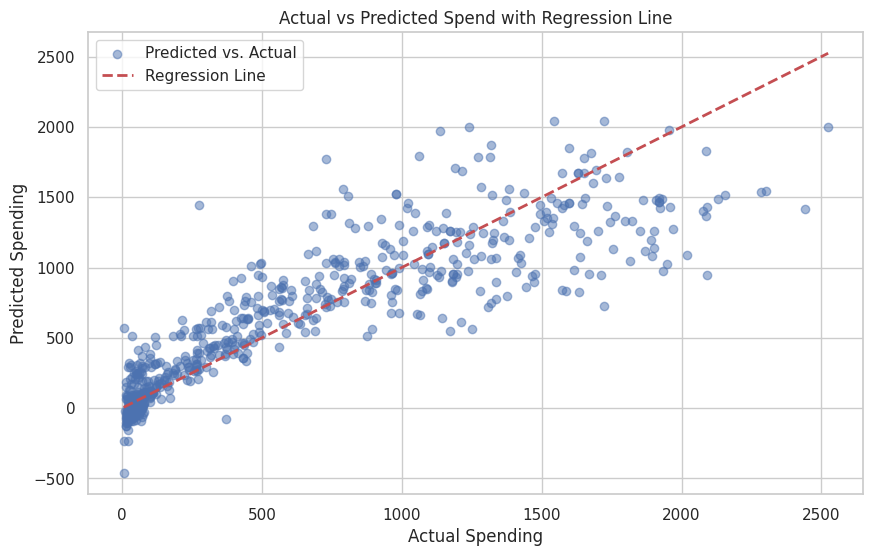

Spend = -766.40 + (0.00 * Income) + (0.64 * Recency) + (-10.84 * NumDealsPurchases) + (41.74 * NumWebPurchases) + (70.69 * NumCatalogPurchases) + (39.33 * NumStorePurchases) + (-14.71 * NumWebVisitsMonth) + (-92.90 * Complain) + (-0.65 * age) + (76.57 * length) + (257.26 * AnyAcceptedCmp) + (-18.25 * Education_Graduation) + (-12.61 * Marital_Status_Married) + (19.09 * Marital_Status_Single) + (-4.80 * Marital_Status_Together) + (-212.28 * Has_Kids_Teenagers_Yes)


In [109]:
# Creat a copy of the original DataFrame
df_linear_regression = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_linear_regression = pd.get_dummies(df_linear_regression, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
# Removing variables used when creating a spend variable to prevent multicollineariy
df_linear_regression = df_linear_regression.drop(columns = ['MntWines', 'MntMeatProducts','MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'Response'])
# Separate the target variable and features
X = df_linear_regression.drop(columns = ['ID', 'spend'])
y = df_linear_regression['spend']
# Convert boolean columns to integers (Education, Marital_Status, Has_Kids_Teenagers)
bool_columns = X.select_dtypes(include=['bool']).columns
X[bool_columns] = X[bool_columns].astype(int)
# Ensure that all data types are numeric
X = X.apply(pd.to_numeric, errors='coerce')
# Add a constant term for the intercept
X = sm.add_constant(X)
# Split the dataset into train set and test set with the ration of 7:3
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# Fit the model
model = sm.OLS(y_train, X_train).fit()
# print the summary which includes coefficients and p-values
print(model.summary())

# Predict on test set
y_pred = model.predict(X_test)
# Scatter plot
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs. Actual")
# Add regression line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Regression Line")

plt.xlabel("Actual Spending")
plt.ylabel("Predicted Spending")
plt.title("Actual vs Predicted Spend with Regression Line")
plt.legend()
plt.show()

# Extract coefficients
intercept = model.params[0]
coefficients = model.params[1:]
# Construct regression equation
regression_equation = f"Spend = {intercept:.2f}"
for idx, col in enumerate(X.columns[1:]):
  regression_equation += f" + ({coefficients[idx]:.2f} * {col})"
print(regression_equation)

**Interpretation of Coefficients**

**Positive Coefficients:**
1. NumCatalogPurchases (206.8866896):
- For each additional catalog purchase, the total spending increases by approximately 206.89 units.
2. NumStorePurchases (127.946522):
- For each additional store purchase, the total spending increases by approximately 127.95 units.
3. NumWebPurchases (114.202881):
- For each additional web purchase, the total spending increases by approximately 114.20 units.
4. AnyAcceptedCmp (104.006866):
- If a customer accepted any campaign, the total spending increases by approximately 104.01 units.
5. Income (80.917546):
- For each additional unit of income, the total spending increases by approximately 80.92 units.
6. length (52.298153):
- For each additional year a customer has been with the company, the total spending increases approximately 52.30 units.
7. Recency (18.483075):
- For each additional day since the last purchase, the toal spending increases by approximately 18.48 units. This might indicate that customers who haven't purchased recently might have had a high total spend.
8. Marital_Status_Single (7.920046):
- Being single is associated with an increase in total spending by approximately 7.92 units.


**Negative Coefficients:**
1. Marital_Status_Together (-2.127594):
- Being in a relationship (together) is associated with a decrease in total spending by approximately 2.13 units.
2. Martial_Status_Married (-6.181900):
- Being married is associated with a decrease in total spending by approximately 6.18 units.
3. age (-7.741951):
- For each additional year of age, the total spending decreases by approximately 7.74 units.
4. Education_Graduation (-8.850775):
- Having a graduation education level is associated with a decrease in total spending by approximately 8.85 units.
5. Complain (-9.172711):
- Having a complaint is associated with a decrease in total spending by approximately 9.17 units.
6. NumDealsPurchases (-20.873778):
- For each additional purchase made with a deal, the total spending decreases by approximately 20.87 units.
7. NumWebVisistsMonth (-35.694838):
- For each additional web visit per month, the total spending decreases by approximately 35.69 units.
8. Has_Kids_Teenagers_Yes (-95.689701):
- Having kids or teenagers is associated with a decrease in total spending by approximately 95.69 units.


####**2. Customer Segmentation**

In [110]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
# Creat a copy of the DataFrame after the linear regression
df_clustering = df_linear_regression.copy()
# Predict spending for all customers
df_clustering['Predicted_Spend'] = model.predict(sm.add_constant(X))
# Select features for clustering
p_values = model.pvalues
coefficients = model.params
significance_level = 0.05
significant_features = p_values[p_values < significance_level].index
significant_features = significant_features.drop('const', errors='ignore')
# Creating a new data frame with significant_features as columns
selected_features = X[significant_features]
selected_features = selected_features.apply(pd.to_numeric, errors='coerce')
# Standardize features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(selected_features)
# Apply K-Means Clustering
kmeans = KMeans(n_clusters=4, random_state=42)
df_clustering["Cluster"] = kmeans.fit_predict(features_scaled)
# Map clusters to segments
cluster_to_segment = {
    0 : "Low Spender",
    1 : "Medium Spender",
    2 : "High Spender",
    3 : "Very High Spender"
}
df_clustering['Segment'] = df_clustering['Cluster'].map(cluster_to_segment)
df_clustering['Predicted_Spend'] = pd.to_numeric(df_clustering['Predicted_Spend'], errors ='coerce')
# cluster_analysis = selected_features.only()
cluster_analysis = selected_features.copy()
cluster_analysis['Cluster'] = df_clustering['Cluster']
cluster_analysis = cluster_analysis.groupby('Cluster').mean()
# Set display options for better readability.
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 1000)  # Adjust display width
print(cluster_analysis)
# Print the segmentation result
print(df_clustering[['Predicted_Spend', 'Segment', 'Cluster']])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


          Income  Recency  NumDealsPurchases  NumWebPurchases  NumCatalogPurchases  NumStorePurchases  NumWebVisitsMonth  length  AnyAcceptedCmp  Has_Kids_Teenagers_Yes
Cluster                                                                                                                                                                 
0       33802.41    48.90               1.81             1.95                 0.47               3.13               6.39   10.82            0.07                    0.88
1       49822.80    51.31               5.56             5.87                 2.44               6.00               7.23   11.42            0.23                    0.97
2       77932.77    49.03               1.03             4.75                 5.89               8.15               2.54   10.94            0.45                    0.01
3       64601.94    47.89               2.41             6.52                 3.92               8.72               4.73   10.98            0.21           

In [111]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

               sum_sq      df       F  PR(>F)
Segment  492821524.47    3.00 2707.54    0.00
Residual 129172065.67 2129.00     NaN     NaN
             Multiple Comparison of Means - Tukey HSD, FWER=0.05             
    group1           group2       meandiff p-adj   lower      upper    reject
-----------------------------------------------------------------------------
  High Spender       Low Spender -1192.501   0.0 -1228.3704 -1156.6316   True
  High Spender    Medium Spender -713.7407   0.0  -759.6857  -667.7958   True
  High Spender Very High Spender -397.7863   0.0   -440.135  -355.4376   True
   Low Spender    Medium Spender  478.7602   0.0   437.5521   519.9684   True
   Low Spender Very High Spender  794.7147   0.0   757.5585   831.8708   True
Medium Spender Very High Spender  315.9544   0.0    268.998   362.9109   True
-----------------------------------------------------------------------------


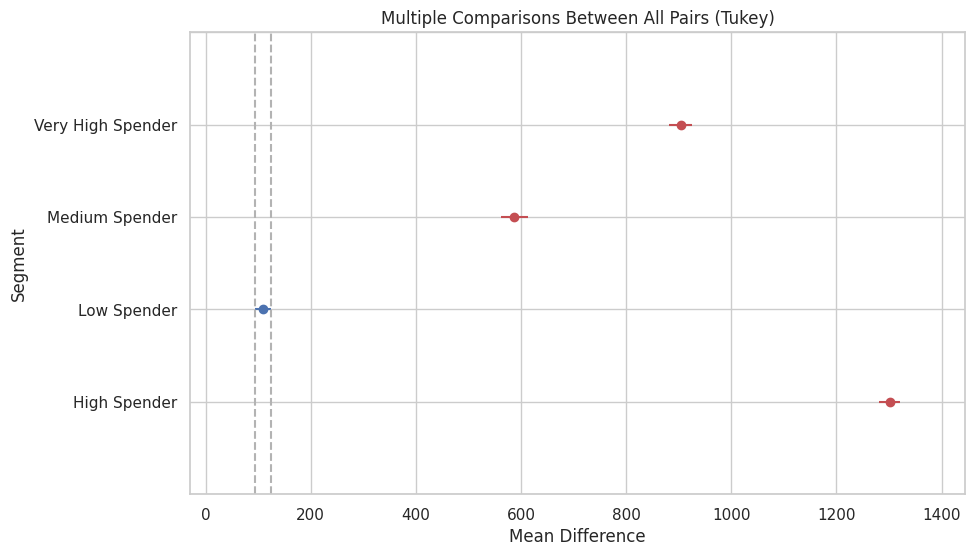

In [112]:
# Perform ANOVA test
anova_model = ols('Predicted_Spend ~ Segment', data=df_clustering).fit()
anova_table = sm.stats.anova_lm(anova_model, typ=2)
print(anova_table)

# Conduct Tukey's HSD test
tukey = pairwise_tukeyhsd(endog=df_clustering['Predicted_Spend'], groups=df_clustering['Segment'], alpha=0.05)
print(tukey)

# Plotting the results of Tukey's HSD test
tukey.plot_simultaneous(comparison_name='Low Spender', xlabel='Mean Difference', ylabel='Segment')
plt.show()

### **Part 2: Classification**

#### **1. Logistics Regression**

In [113]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

Confusion Matrix:
[[528  18]
 [ 57  37]]


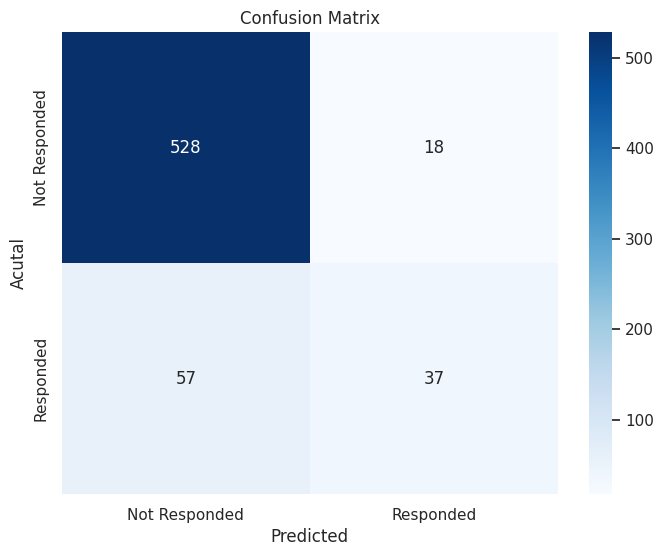


Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       546
           1       0.67      0.39      0.50        94

    accuracy                           0.88       640
   macro avg       0.79      0.68      0.72       640
weighted avg       0.87      0.88      0.87       640


AUC-ROC Score:
0.870771958537916


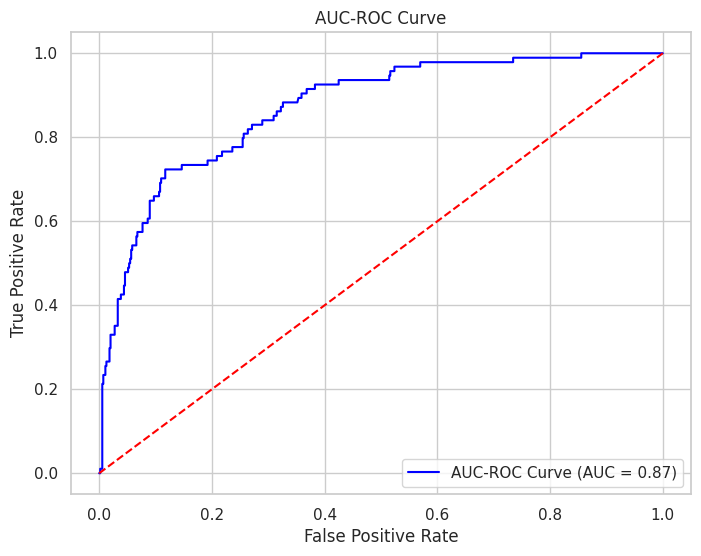

In [114]:
# Create a copy of the original DataFrame
df_logistic_regression = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_logistic_regression = pd.get_dummies(df_logistic_regression, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_logistic_regression = df_logistic_regression.drop(columns = ['MntWines', 'MntMeatProducts','MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])
# Removing variables used when creating a spend variable to prevent multicollineariy
X = df_logistic_regression.drop(columns = ['Response', 'ID'])
# Define the dependent variable
y = df_logistic_regression['Response']
# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
# Fit the logistics regression model
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
# Predict on the test set
y_pred = log_reg.predict(X_test_scaled)
y_prob = log_reg.predict_proba(X_test_scaled)[:,1]

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix(y_test, y_pred))

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Acutal')
plt.title('Confusion Matrix')
plt.show()

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nAUC-ROC Score:")
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()

#### **2. Decision Tree**

In [115]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
from pydotplus import graph_from_dot_data
from IPython.display import Image

Confusion Matrix:
conf_matrix


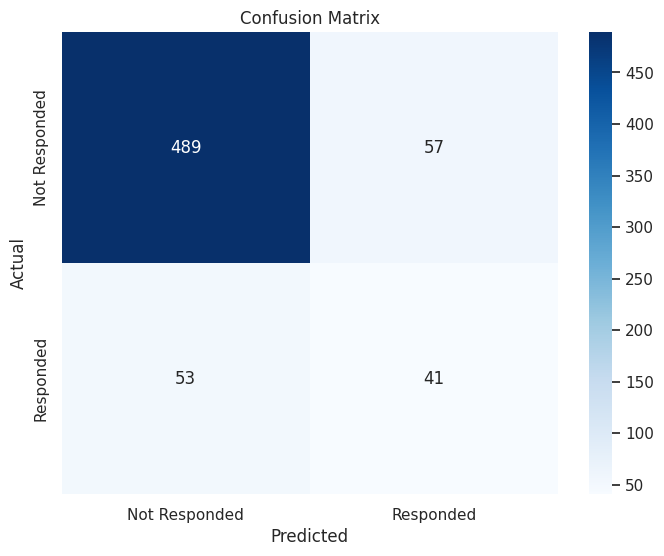


Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       546
           1       0.42      0.44      0.43        94

    accuracy                           0.83       640
   macro avg       0.66      0.67      0.66       640
weighted avg       0.83      0.83      0.83       640


AUC-ROC Score:
0.6691021744213232


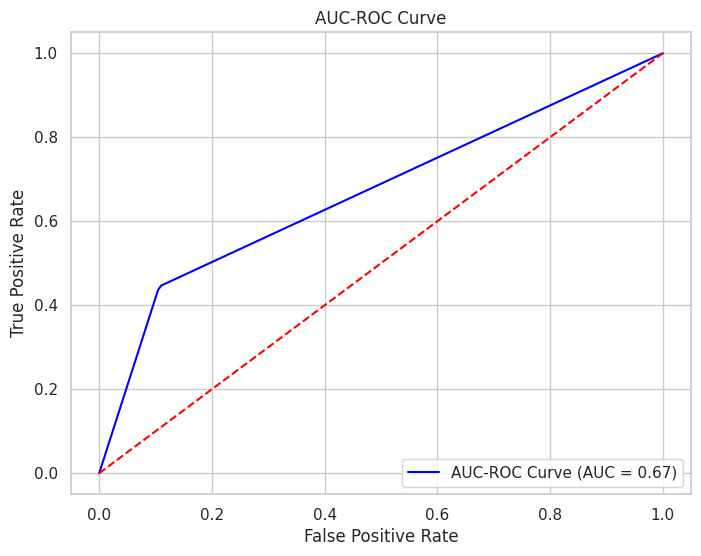

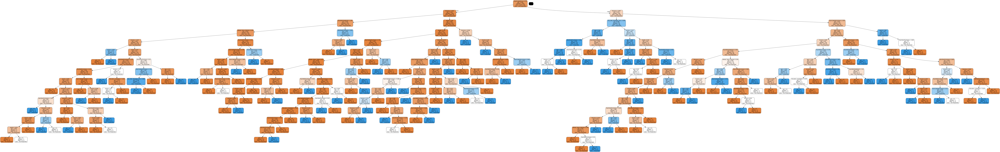

In [116]:
# Create a copy of the original DataFrame
df_decision_tree = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_decision_tree = pd.get_dummies(df_decision_tree, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_decision_tree = df_decision_tree.drop(columns = ['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])
# Creating dependent and independent variables
X = df_decision_tree.drop(columns=['Response', 'ID'])
y = df_decision_tree['Response']
# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Fit the decision tree model
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train_scaled, y_train)
# Predict on the test set
y_pred = decision_tree.predict(X_test_scaled)
y_prob = decision_tree.predict_proba(X_test_scaled)[:,1]
# Evaluate the model
print('Confusion Matrix:')
conf_matrix = confusion_matrix(y_test, y_pred)
print('conf_matrix')
# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print('\nClassification Report:')
print(classification_report(y_test, y_pred))

print('\nAUC-ROC Score:')
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Visualize the Decision Tree using graphviz
dot_data = export_graphviz(decision_tree, out_file=None,
                           feature_names=X.columns,
                           class_names=['Not Responded', 'Responded'],
                           filled=True, rounded=True,
                           special_characters=True)

# Create graph from dot data
graph = graph_from_dot_data(dot_data)

# Save graph as PNG file
graph.write_png("decision_tree.png")

# Display the decision tree
Image(graph.create_png())

#### **3. Random Forest**

In [117]:
from sklearn.ensemble import RandomForestClassifier

Confusion Matrix:
[[529  17]
 [ 56  38]]


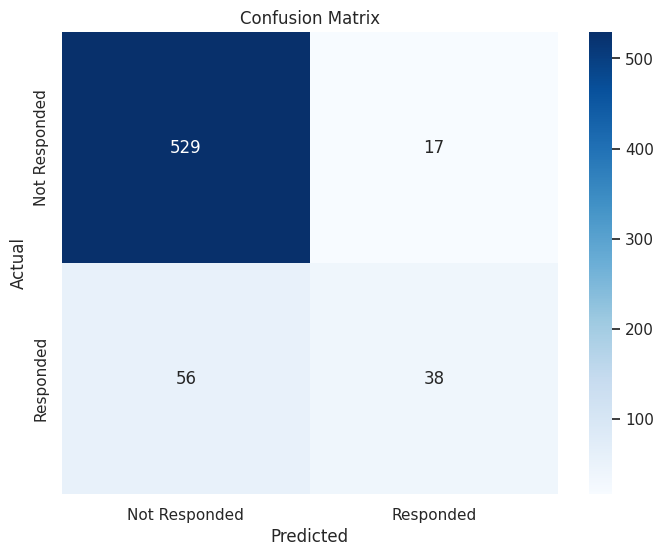


Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.94       546
           1       0.69      0.40      0.51        94

    accuracy                           0.89       640
   macro avg       0.80      0.69      0.72       640
weighted avg       0.87      0.89      0.87       640


AUC-ROC Score:
0.8758280726365832


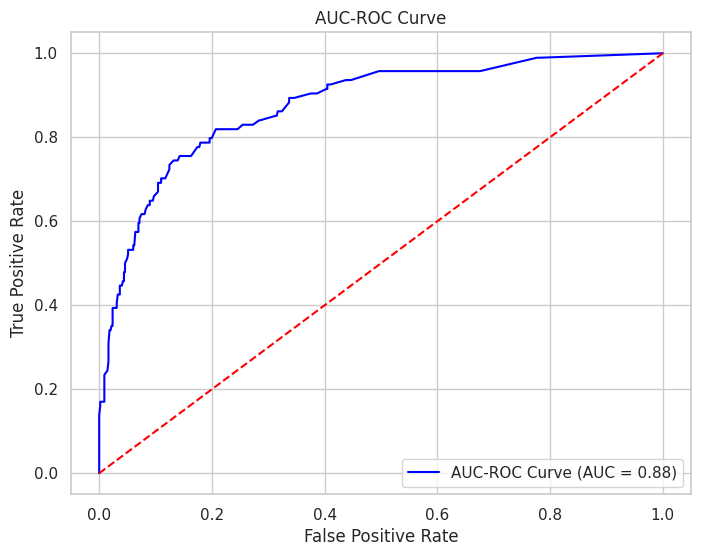

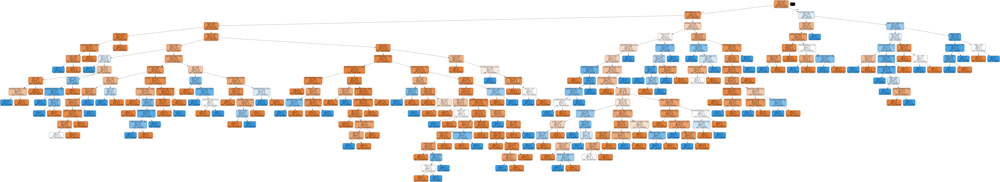

In [118]:
# Create a copy of the original DataFrame
df_random_forest = df.copy()

# Convert categorical variables to numerical format using one-hot encoding
df_random_forest = pd.get_dummies(df_random_forest, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_random_forest = df_random_forest.drop(columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])

# Creating dependent and independent variables
X = df_random_forest.drop(columns=['Response', 'ID'])
y = df_random_forest['Response']

# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the Random Forest model
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = random_forest.predict(X_test_scaled)
y_prob = random_forest.predict_proba(X_test_scaled)[:, 1]

# Evaluate the model
print('Confusion Matrix:')
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print('\nClassification Report:')
print(classification_report(y_test, y_pred))

print('\nAUC-ROC Score:')
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Extract the first tree
tree = random_forest.estimators_[0]

# Export the tree to DOT format
dot_data = export_graphviz(tree, out_file=None,
                           feature_names=X.columns,
                           class_names=['Not Responded', 'Responded'],
                           filled=True, rounded=True,
                           special_characters=True)

# Create graph from dot data
graph = graph_from_dot_data(dot_data)

# Save graph as PNG file
graph.write_png("random_forest_tree.png")

# Display the decision tree
Image(graph.create_png())

#### **4. KNN (K-Nearest Neighbors)**

In [119]:
from sklearn.neighbors import KNeighborsClassifier

Confusion Matrix:
[[531  15]
 [ 67  27]]


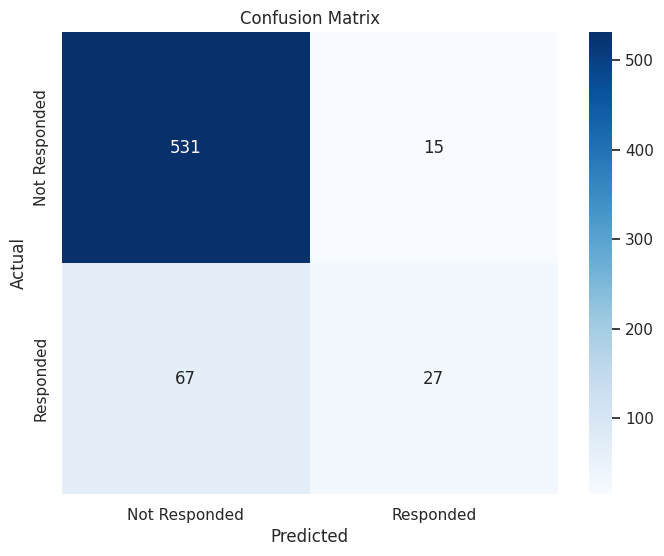


Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       546
           1       0.64      0.29      0.40        94

    accuracy                           0.87       640
   macro avg       0.77      0.63      0.66       640
weighted avg       0.85      0.87      0.85       640


AUC-ROC Score:
0.8176681474553815


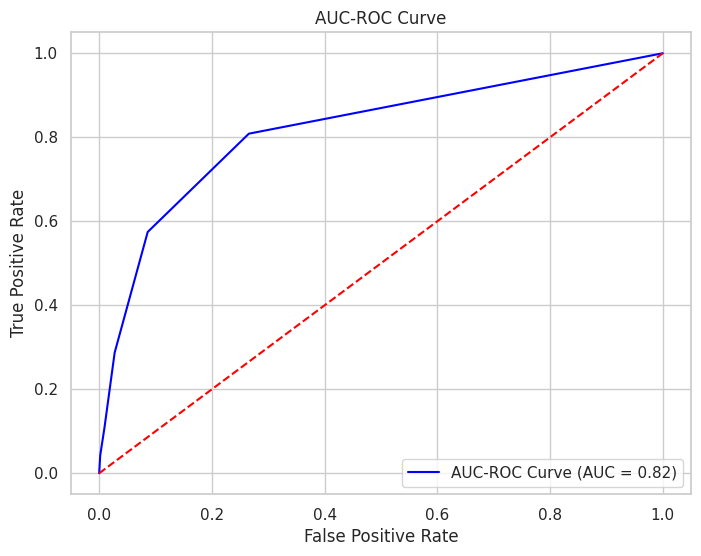

In [120]:
# Create a copy of the original DataFrame
df_knn = df.copy()

# Convert categorical variables to numerical format using one-hot encoding
df_knn = pd.get_dummies(df_knn, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_knn = df_knn.drop(columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])

# Creating dependent and independent variables
X = df_knn.drop(columns=['Response', 'ID'])
y = df_knn['Response']

# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = knn.predict(X_test_scaled)
y_prob = knn.predict_proba(X_test_scaled)[:, 1]

# Evaluate the model
print('Confusion Matrix:')
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print('\nClassification Report:')
print(classification_report(y_test, y_pred))

print('\nAUC-ROC Score:')
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()


####**5. Model Evaluation**

In [121]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, f1_score

Logistic Regression Confusion Matrix:
[[528  18]
 [ 60  34]]

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       546
           1       0.65      0.36      0.47        94

    accuracy                           0.88       640
   macro avg       0.78      0.66      0.70       640
weighted avg       0.86      0.88      0.86       640


Logistic Regression AUC-ROC Score: 0.87

Decision Tree Confusion Matrix:
[[489  57]
 [ 53  41]]

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       546
           1       0.42      0.44      0.43        94

    accuracy                           0.83       640
   macro avg       0.66      0.67      0.66       640
weighted avg       0.83      0.83      0.83       640


Decision Tree AUC-ROC Score: 0.67

Random Forest Confusion Matrix:
[[529  17]
 [ 56  38]]

Random Forest 

<ipython-input-122-d4f9ecb523b2>:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Accuracy', data=summary_df, palette='viridis')


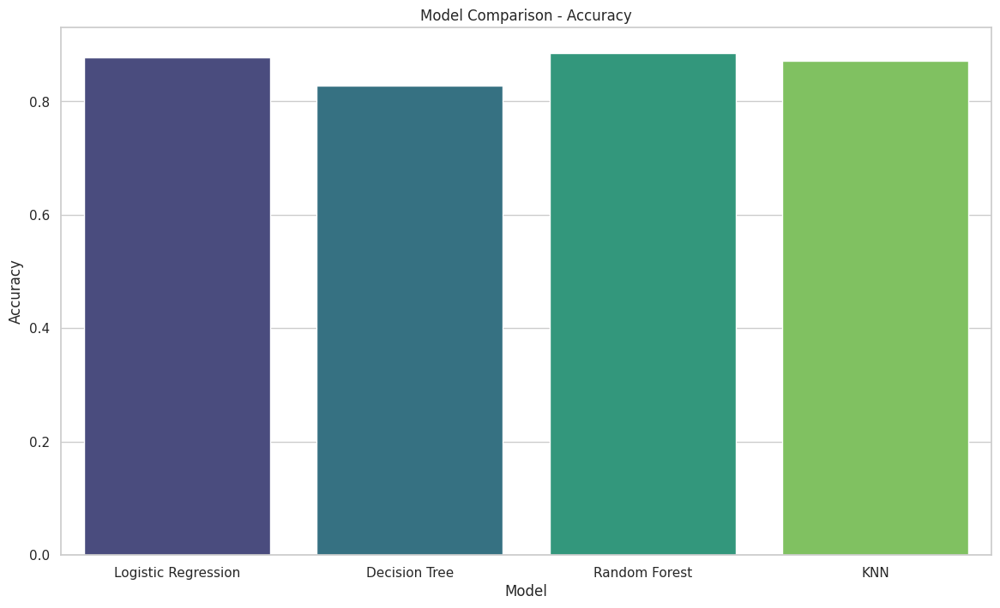

<ipython-input-122-d4f9ecb523b2>:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='F1 Score', data=summary_df, palette='viridis')


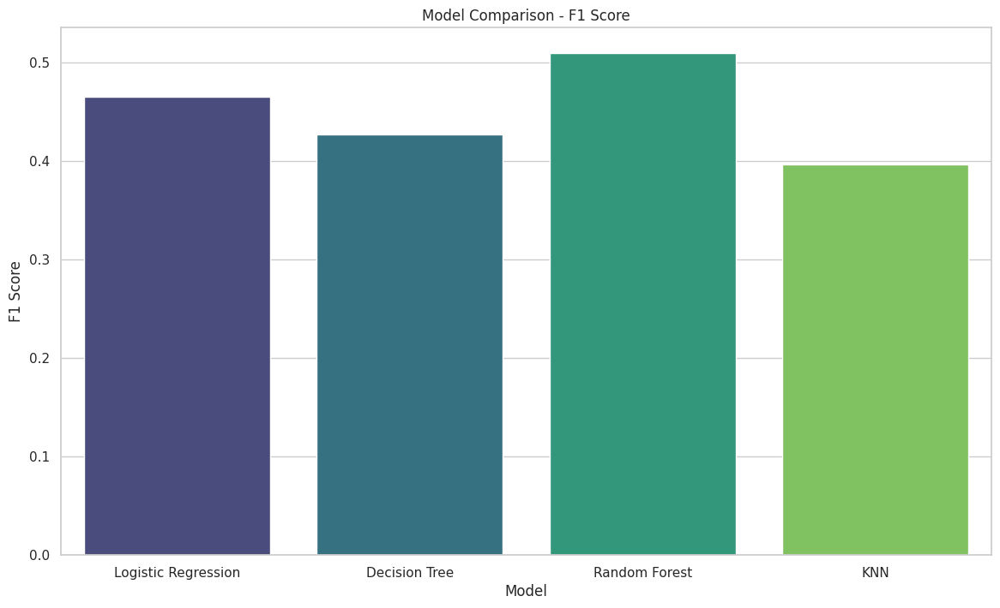

<ipython-input-122-d4f9ecb523b2>:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='AUC', data=summary_df, palette='viridis')


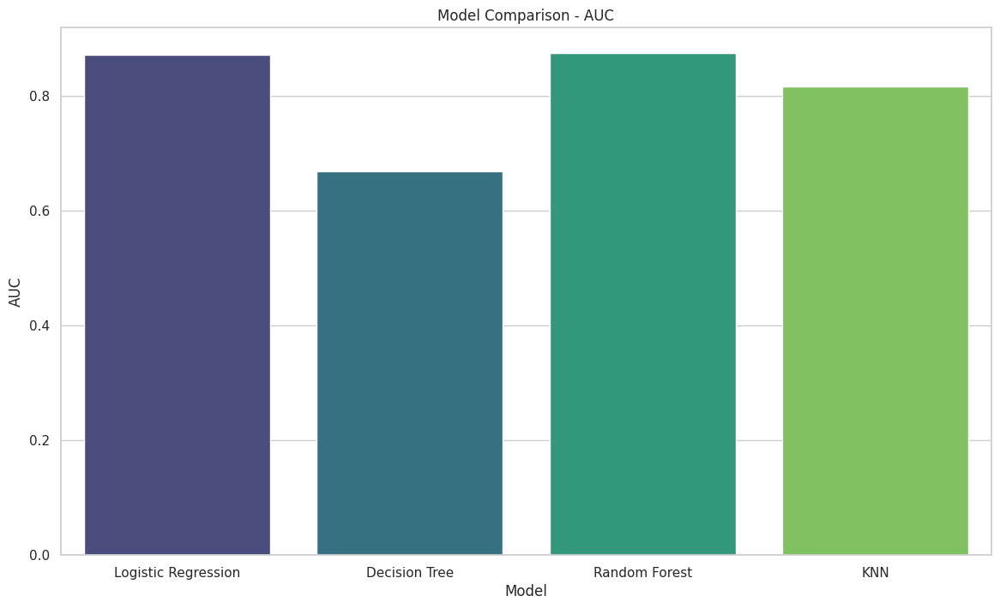

In [122]:
# Create a copy of the original DataFrame
df_models = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_models = pd.get_dummies(df_models, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_models = df_models.drop(columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])
# Creating dependent and independent variables
X = df_models.drop(columns=['Response', 'ID'])
y = df_models['Response']
# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Dictionary to store the metircs
summary = {
    'Model' : [],
    'Accuracy' : [],
    'F1 Score' : [],
    'AUC' : []
}
# Function to evaluate models
def evaluate_model(model, model_name):
  model.fit(X_train_scaled, y_train)
  y_pred = model.predict(X_test_scaled)
  y_prob = model.predict_proba(X_test_scaled)[:,1]

  accuracy = accuracy_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)
  auc = roc_auc_score(y_test, y_prob)

  summary['Model'].append(model_name)
  summary['Accuracy'].append(accuracy)
  summary['F1 Score'].append(f1)
  summary['AUC'].append(auc)

  print(f'{model_name} Confusion Matrix:')
  print(confusion_matrix(y_test, y_pred))

  print(f'\n{model_name} Classification Report:')
  print(classification_report(y_test, y_pred))

  print(f'\n{model_name} AUC-ROC Score: {auc:.2f}\n')

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000, random_state=42)
evaluate_model(log_reg, 'Logistic Regression')

# Decision Tree
decision_tree = DecisionTreeClassifier(random_state=42)
evaluate_model(decision_tree, 'Decision Tree')

# Random Forest
random_forest = RandomForestClassifier(random_state=42)
evaluate_model(random_forest, 'Random Forest')

# K-Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
evaluate_model(knn, 'KNN')

# Create a DataFrame from the summary
summary_df = pd.DataFrame(summary)

# Display the summary table
print(summary_df)

# Plotting the summary metrics
plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='Accuracy', data=summary_df, palette='viridis')
plt.title('Model Comparison - Accuracy')
plt.show()

plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='F1 Score', data=summary_df, palette='viridis')
plt.title('Model Comparison - F1 Score')
plt.show()

plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='AUC', data=summary_df, palette='viridis')
plt.title('Model Comparison - AUC')
plt.show()

| Model                | Accuracy | F1 Score | AUC  |
|----------------------|----------|----------|------|
| Logistic Regression  | 0.88     | 0.47     | 0.87 |
| Decision Tree        | 0.83     | 0.43     | 0.67 |
| Random Forest        | 0.89     | 0.51     | 0.88 |
| KNN                  | 0.87     | 0.40     | 0.82 |


##**6. Final Model Selection**

### **Random Forest**

####**1. Feature Importances**

                    Feature  Importance
1                   Recency        0.15
10                    spend        0.13
0                    Income        0.12
11           AnyAcceptedCmp        0.09
8                       age        0.09
4       NumCatalogPurchases        0.07
5         NumStorePurchases        0.06
6         NumWebVisitsMonth        0.06
3           NumWebPurchases        0.06
2         NumDealsPurchases        0.05
9                    length        0.03
16   Has_Kids_Teenagers_Yes        0.02
14    Marital_Status_Single        0.02
13   Marital_Status_Married        0.02
12     Education_Graduation        0.02
15  Marital_Status_Together        0.02
7                  Complain        0.00


<ipython-input-123-7ab0ed7352fb>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importance", y="Feature", data=top_3_features, palette='viridis')


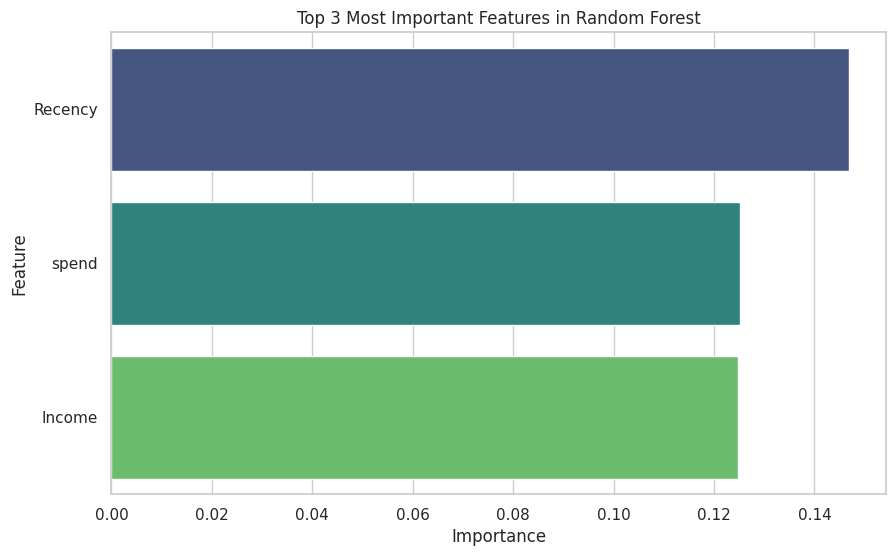

In [123]:
# Get feature importances
feature_importances = random_forest.feature_importances_
# Create a DataFrame for feature importance
features_df = pd.DataFrame({
    'Feature' : X.columns,
    'Importance' : feature_importances
})
# Sort the DataFrame by Importance
features_df = features_df.sort_values(by='Importance', ascending=False)
print(features_df)
# Select the top 3 most important features
top_3_features = features_df.head(3)
# Plot the Top 3 Features
plt.figure(figsize=(10,6))
sns.barplot(x="Importance", y="Feature", data=top_3_features, palette='viridis')
plt.title('Top 3 Most Important Features in Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()